# PROGETTO BUSINESS INTELLIGENCE PER SERVIZI FINANZIARI 

##                                                                     Svolto da Mattia Milanese 869161, Febbraio 2023

# 2)STATISTICHE DESCRITTIVE

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


,XOM,EOG,ORCL,SNPS,PNC,MTB
Date,,,,,,
2012-11-30 00:00:00-05:00,57.710163,47.244045,27.507582,32.860001,42.399406,75.840446
2012-12-03 00:00:00-05:00,57.363132,47.091412,27.618706,33.139999,41.772560,75.413612
2012-12-04 00:00:00-05:00,57.088150,47.067318,27.678541,33.230000,41.598858,74.614357
2012-12-05 00:00:00-05:00,57.441704,47.685890,27.353720,33.330002,42.210602,74.746269
2012-12-06 00:00:00-05:00,57.618484,47.541271,27.379364,32.919998,41.787663,75.537781


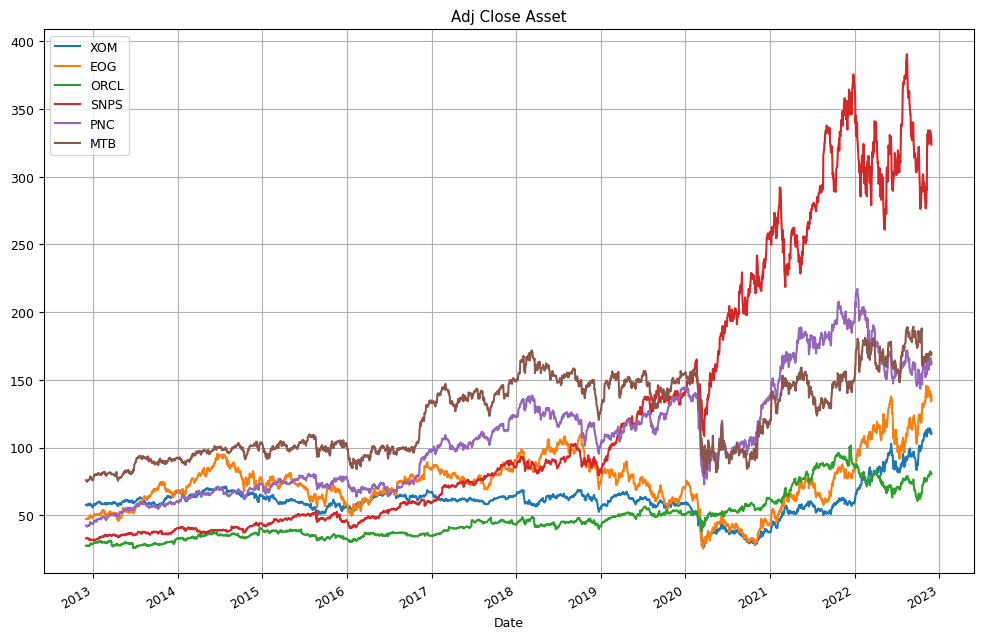

In [44]:
from datetime import date,datetime
import pyfolio as pf
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import math as math
import pandas as pd
import statsmodels.api as sm
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
import itertools
import warnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.formula.api as smf
import matplotlib.dates as mdates
from pytrends.request import TrendReq
import scipy.optimize as sco
from statsmodels.tsa.seasonal import seasonal_decompose as seasonalDecompose
warnings.filterwarnings("ignore")


#periodi di analisi
start_date = "2012-11-30"
end_date = "2022-11-30"

#creo i dataFrame di ogni mio asset;
XOM_df = yf.download("XOM", start_date, end_date)
EOG_df = yf.download("EOG", start_date, end_date)
ORCL_df = yf.download("ORCL", start_date, end_date)
SNPS_df = yf.download("SNPS", start_date, end_date)
PNC_df = yf.download("PNC", start_date, end_date)
MTB_df = yf.download("MTB", start_date, end_date)

#variabili utili successivamente
asset_name = ["XOM","EOG","ORCL","SNPS","PNC","MTB"]
list_df_asset = [XOM_df,EOG_df,ORCL_df,SNPS_df,PNC_df,MTB_df]
XOM_df_month = XOM_df["Adj Close"].resample("M").last()
EOG_df_month = EOG_df["Adj Close"].resample("M").last()
ORCL_df_month = ORCL_df["Adj Close"].resample("M").last()
SNPS_df_month = SNPS_df["Adj Close"].resample("M").last()
MTB_df_month = MTB_df["Adj Close"].resample("M").last()
PNC_df_month = PNC_df["Adj Close"].resample("M").last()
list_df_month = [XOM_df_month, EOG_df_month,ORCL_df_month,SNPS_df_month,PNC_df_month,MTB_df_month]
sp500_df = yf.download("^GSPC",start_date,end_date)
#creo un dataframe contenente tutti gli asset
adj_close_asset = pd.concat([XOM_df["Adj Close"],EOG_df["Adj Close"], ORCL_df["Adj Close"],
                          SNPS_df["Adj Close"],PNC_df["Adj Close"],MTB_df["Adj Close"]],axis = 1)
adj_close_asset.columns = ["XOM","EOG","ORCL","SNPS","PNC","MTB"]

#creo il grafico e stampo le prime right del Data Frame
adj_close_asset.plot(grid=True, title = "Adj Close Asset")
adj_close_asset.head()

## 2a) Rendimenti cumulati e composti annui del periodo

In [3]:
#calcolo i due rendimenti mediante la formula
r_cum_annuo= adj_close_asset.tail(1).iloc[0]/adj_close_asset.head(1).iloc[0]
r_comp_annuo=pow(r_cum_annuo,(1/10))-1

print("Rendimento cumulato: ")
print(r_cum_annuo)

print("\nRendimento composto annuo: ")
print(r_comp_annuo)

Rendimento cumulato: 
XOM     1.915435
EOG     2.936755
ORCL    2.928209
SNPS    9.849665
PNC     3.842259
MTB     2.237855
dtype: float64

Rendimento composto annuo: 
XOM     0.067153
EOG     0.113748
ORCL    0.113423
SNPS    0.257020
PNC     0.144086
MTB     0.083885
dtype: float64


# 2b) Rendimenti semplici e logaritmici

Settore energetico-petrolifero


,XOM,EOG,ORCL,SNPS,PNC,MTB
Date,,,,,,
2012-12-03 00:00:00-05:00,-0.006013,-0.003231,0.004040,0.008521,-0.014784,-0.005628
2012-12-04 00:00:00-05:00,-0.004794,-0.000512,0.002166,0.002716,-0.004158,-0.010598
2012-12-05 00:00:00-05:00,0.006193,0.013142,-0.011735,0.003009,0.014706,0.001768
2012-12-06 00:00:00-05:00,0.003078,-0.003033,0.000938,-0.012301,-0.010020,0.010589
2012-12-07 00:00:00-05:00,0.006818,-0.008533,-0.003434,0.000000,0.008494,0.003082


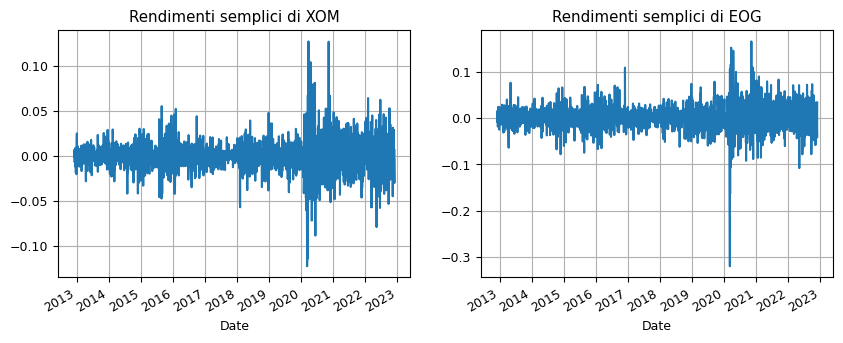

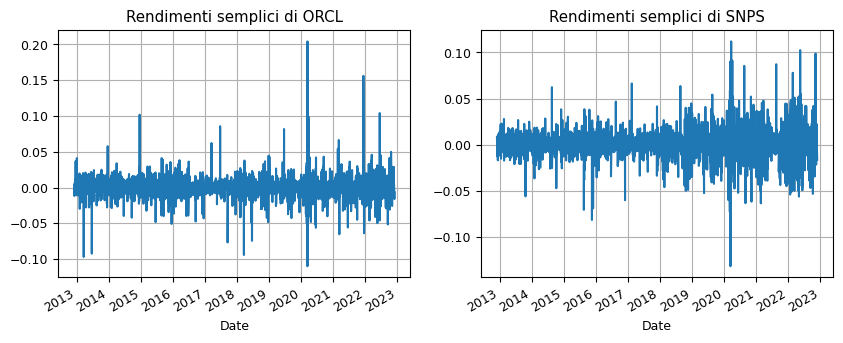

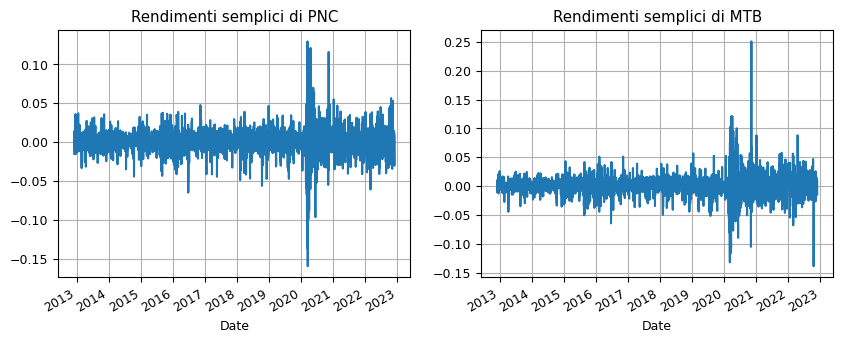

In [46]:
#rendimenti semplici
rs_asset = adj_close_asset.pct_change()
rs_asset = rs_asset.dropna()


#creo un grafico in base al settore, e creo dei sottografici che mostrano i rendimenti semplici dei titoli
plt.figure(figsize=(10, 8))
print("Settore energetico-petrolifero")
plt.rc('font', size=9)
plt.subplot(221)
rs_asset["XOM"].plot(grid=True, title = 'Rendimenti semplici di XOM')
plt.subplot(222)
rs_asset["EOG"].plot(grid=True, title = 'Rendimenti semplici di EOG')

#creo un grafico in base al settore, e creo dei sottografici che mostrano i rendimenti logaritmici dei titoli

plt.figure(figsize=(10, 8))
plt.rc('font', size=9)
plt.subplot(221)
rs_asset["ORCL"].plot(grid=True, title = 'Rendimenti semplici di ORCL')
plt.subplot(222)
rs_asset["SNPS"].plot(grid=True, title = 'Rendimenti semplici di SNPS')

#creo un grafico in base al settore, e creo dei sottografici che mostrano i rendimenti logaritmici dei titoli

plt.figure(figsize=(10, 8))
plt.rc('font', size=9)
plt.subplot(221)
rs_asset["PNC"].plot(grid=True, title = 'Rendimenti semplici di PNC')
plt.subplot(222)
rs_asset["MTB"].plot(grid=True, title = 'Rendimenti semplici di MTB')

rs_asset.head()

,XOM,EOG,ORCL,SNPS,PNC,MTB
Date,,,,,,
2012-12-03 00:00:00-05:00,-0.006031,-0.003236,0.004031,0.008485,-0.014895,-0.005644
2012-12-04 00:00:00-05:00,-0.004806,-0.000512,0.002164,0.002712,-0.004167,-0.010656
2012-12-05 00:00:00-05:00,0.006175,0.013057,-0.011805,0.003005,0.014599,0.001766
2012-12-06 00:00:00-05:00,0.003073,-0.003037,0.000937,-0.012378,-0.010070,0.010534
2012-12-07 00:00:00-05:00,0.006795,-0.008570,-0.003440,0.000000,0.008458,0.003077


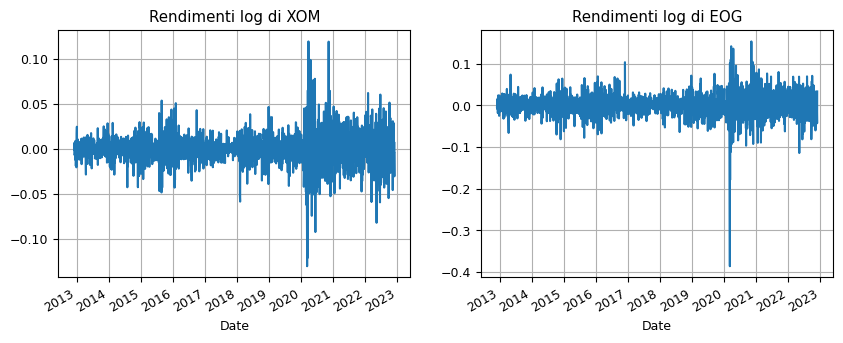

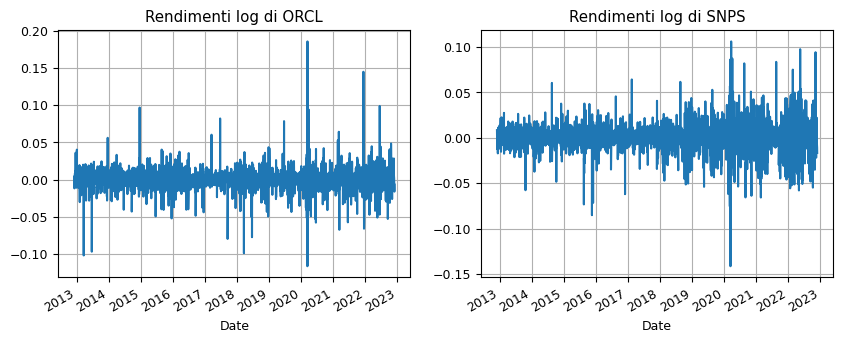

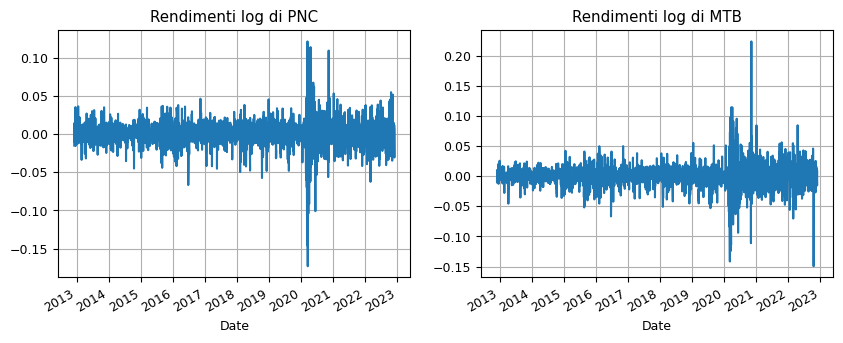

In [5]:
#rendimenti logaritmici
rl_asset = np.log(adj_close_asset/adj_close_asset.shift(1))
rl_asset = rl_asset.dropna()


#creo un grafico in base al settore, e creo dei sottografici che mostrano i rendimenti logaritmici dei titoli
plt.figure(figsize=(10, 8))
plt.rc('font', size=9)
plt.subplot(221)
rl_asset["XOM"].plot(grid=True, title = 'Rendimenti log di XOM')
plt.subplot(222)
rl_asset["EOG"].plot(grid=True, title = 'Rendimenti log di EOG')

#creo un grafico in base al settore, e creo dei sottografici che mostrano i rendimenti logaritmici dei titoli
plt.figure(figsize=(10, 8))
plt.rc('font', size=9)
plt.subplot(221)
rl_asset["ORCL"].plot(grid=True, title = 'Rendimenti log di ORCL')
plt.subplot(222)
rl_asset["SNPS"].plot(grid=True, title = 'Rendimenti log di SNPS')

#creo un grafico in base al settore, e creo dei sottografici che mostrano i rendimenti logaritmici dei titoli
plt.figure(figsize=(10, 8))
plt.rc('font', size=9)
plt.subplot(221)
rl_asset["PNC"].plot(grid=True, title = 'Rendimenti log di PNC')
plt.subplot(222)
rl_asset["MTB"].plot(grid=True, title = 'Rendimenti log di MTB')

rl_asset.head()



# 2d) Istogrammi dei rendimenti

<AxesSubplot:title={'center':'        Distribuzione dei rendimenti di MTB'}, ylabel='Density'>

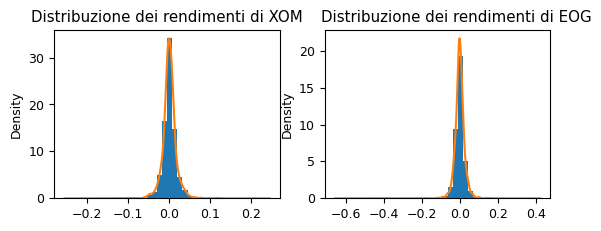

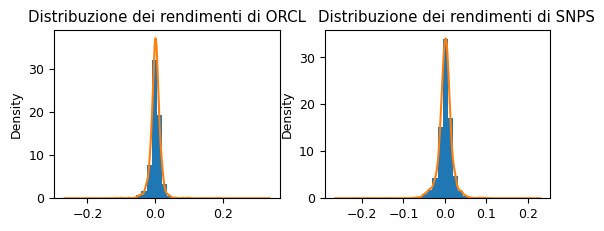

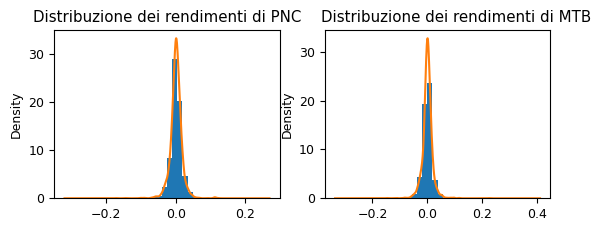

In [6]:
#creo un grafico in base al settore che contenga i grafici della distribuzione dei rendimenti dei titoli
#XOM
plt.figure()
plt.subplot(221)
plt.hist(rl_asset["XOM"], density = True, bins=20)
plt.title('Distribuzione dei rendimenti di XOM')
rl_asset["XOM"].plot.density()

#EOG
plt.subplot(222)
plt.hist(rl_asset["EOG"], density = True, bins=20)
plt.title('        Distribuzione dei rendimenti di EOG')
rl_asset["EOG"].plot.density()

#creo un grafico in base al settore che contenga i grafici della distribuzione dei rendimenti dei titoli
#ORCL
plt.figure()
plt.subplot(221)
plt.hist(rl_asset["ORCL"], density = True, bins=20)
plt.title('Distribuzione dei rendimenti di ORCL')
rl_asset["ORCL"].plot.density()

#SNPS
plt.subplot(222)
plt.hist(rl_asset["SNPS"], density = True, bins=20)
plt.title('        Distribuzione dei rendimenti di SNPS')
rl_asset["SNPS"].plot.density()

#creo un grafico in base al settore che contenga i grafici della distribuzione dei rendimenti dei titoli
#PNC
plt.figure()
plt.subplot(221)
plt.hist(rl_asset["PNC"], density = True, bins=20)
plt.title('Distribuzione dei rendimenti di PNC')
rl_asset["PNC"].plot.density()

#MTB
plt.subplot(222)
plt.hist(rl_asset["MTB"], density = True, bins=20)
plt.title('        Distribuzione dei rendimenti di MTB')
rl_asset["MTB"].plot.density()

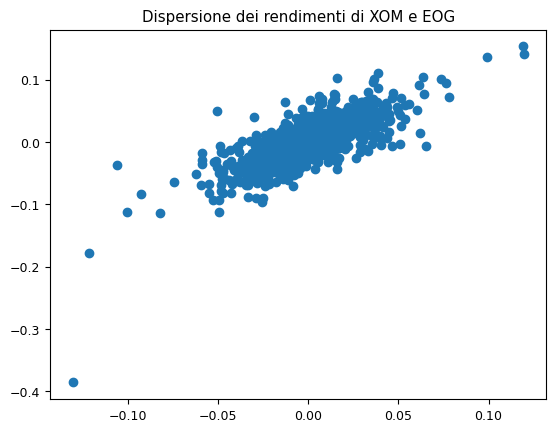

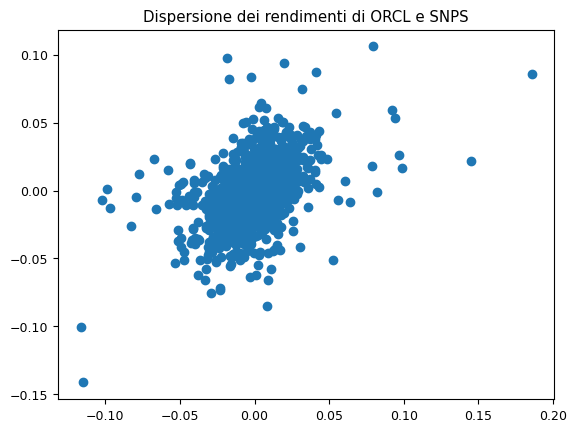

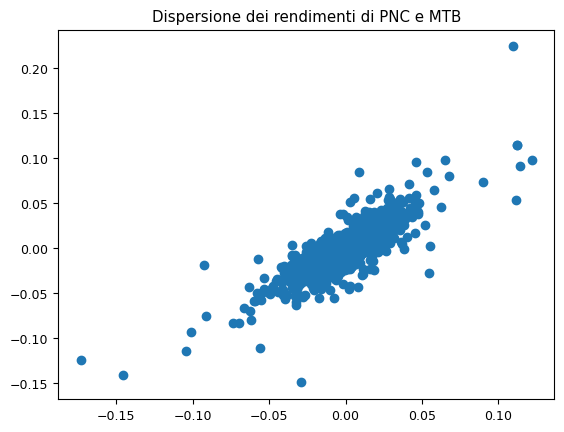

In [7]:
#grafico di dispersione
#creo i grafici di dispersione per rendimenti di asset nello stesso settore
plt.figure()

plt.title("Dispersione dei rendimenti di XOM e EOG")
plt.scatter(rl_asset["XOM"], rl_asset["EOG"])


plt.figure()
plt.title("Dispersione dei rendimenti di ORCL e SNPS")
plt.scatter(rl_asset["ORCL"],rl_asset["SNPS"])


plt.figure()

plt.title("Dispersione dei rendimenti di PNC e MTB")
plt.scatter(rl_asset["PNC"],rl_asset["MTB"])



# 2e) Grafici diagnostici

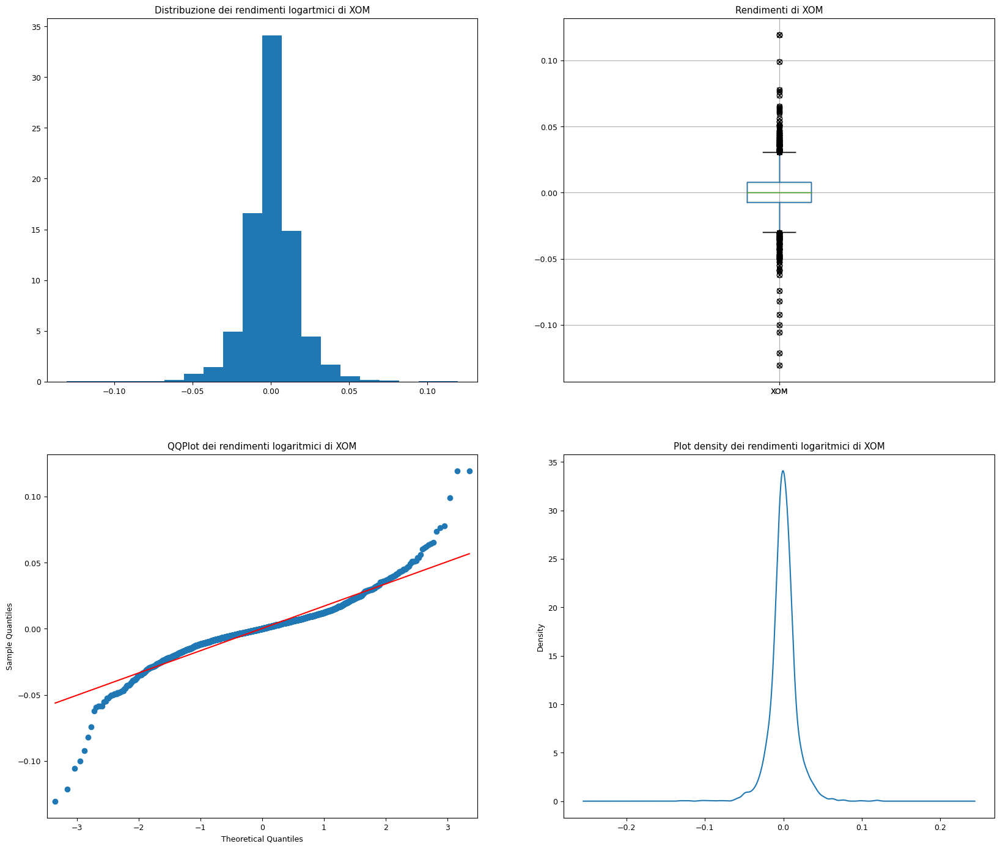

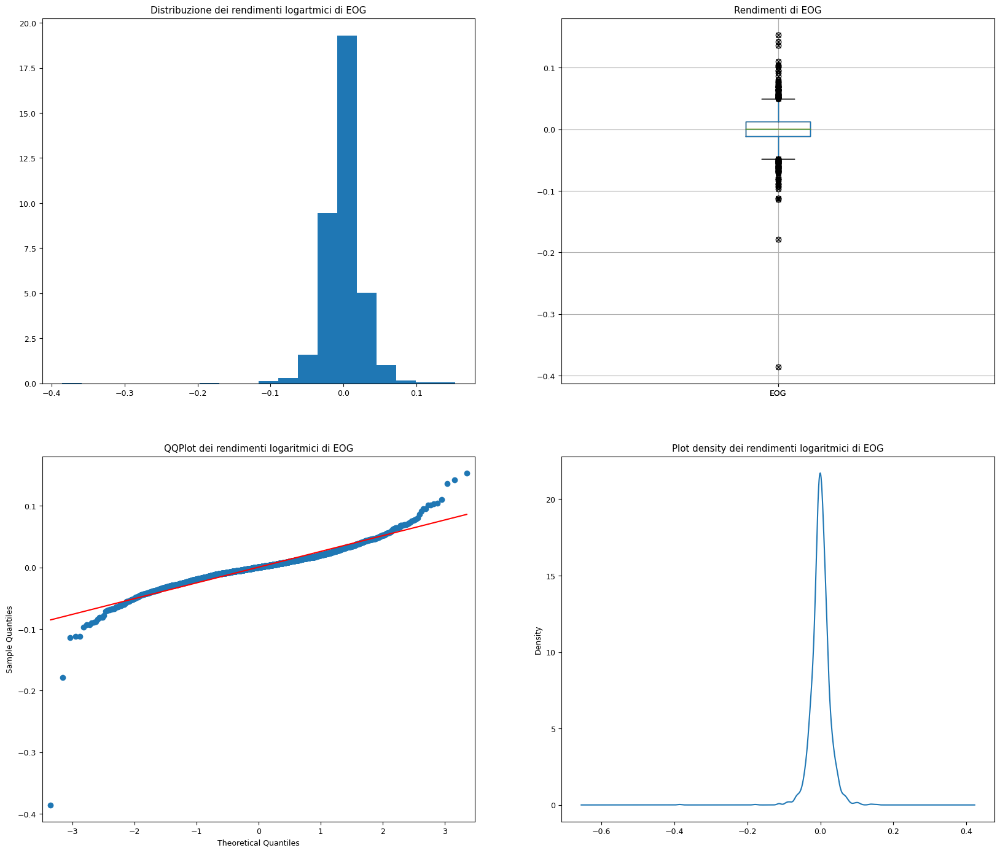

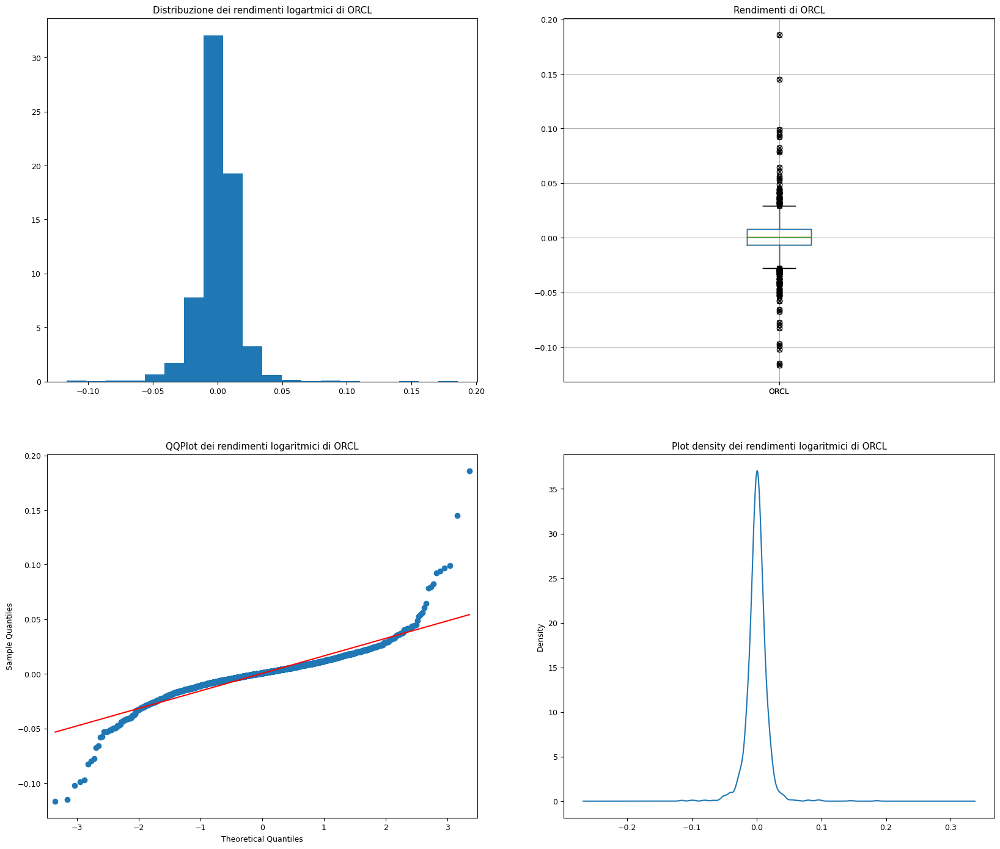

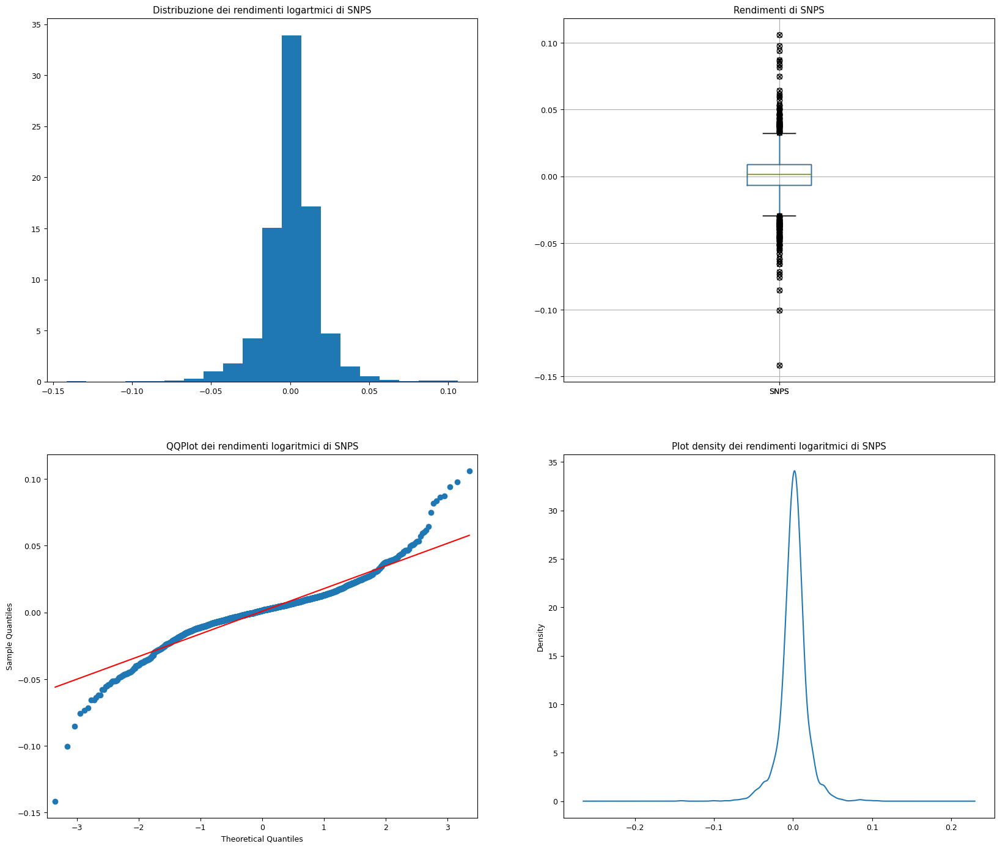

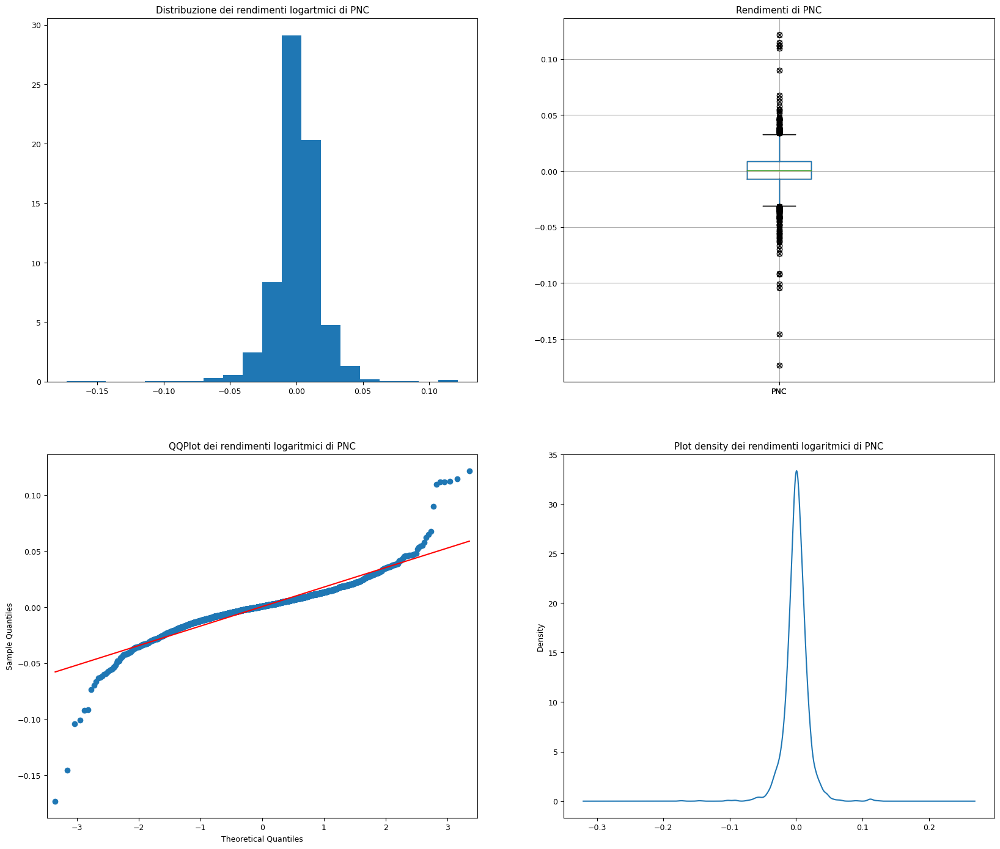

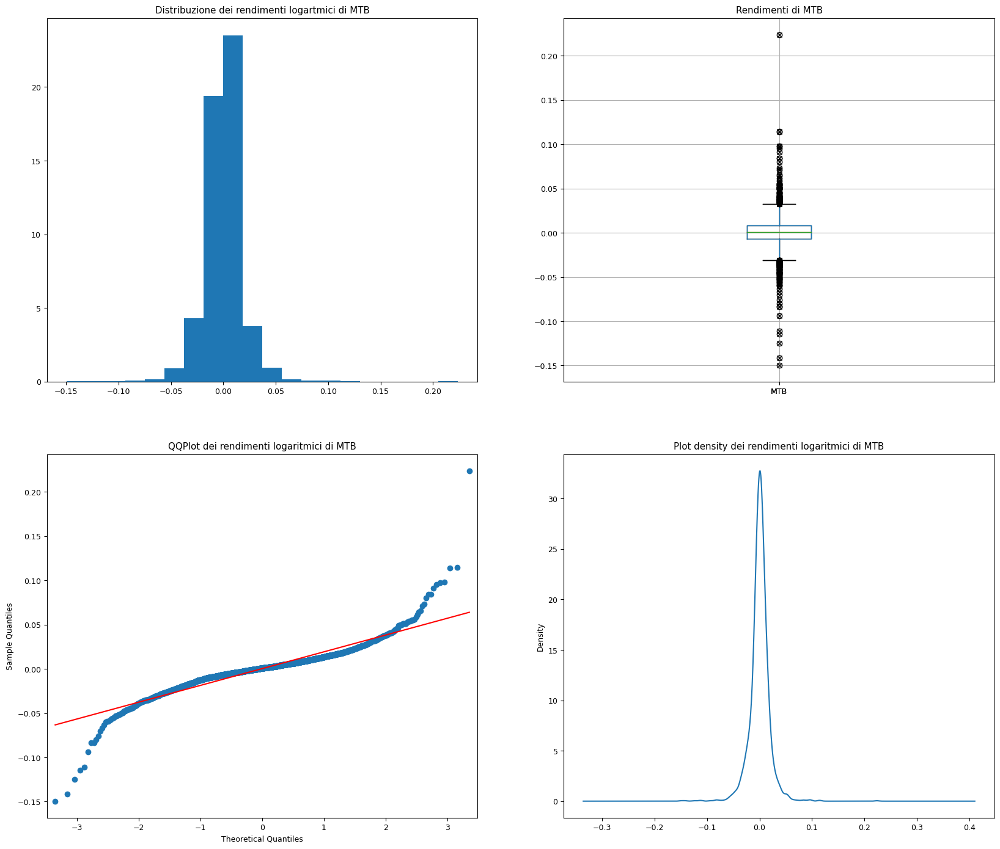

In [8]:
#Per ogni asset analizzato creo i grafici diagnostici

for asset in asset_name:
    plt.figure(figsize=(20,17))

    # Istogramma
    ax = plt.subplot(221)
    plt.hist(rl_asset[asset], density = True, bins=20)
    title = 'Distribuzione dei rendimenti logartmici di '+asset
    plt.title(title)


    # BoxPlot
    ax = plt.subplot(222)
    plt.boxplot(rl_asset[asset], sym = 'x')
    title = "Rendimenti di "+asset
    plt.title(title)
    rl_asset[asset].to_frame().boxplot();

    # QQ
    ax = plt.subplot(223)
    title = 'QQPlot dei rendimenti logaritmici di '+asset
    sm.graphics.qqplot(rl_asset[asset], line = 's', ax = ax);
    plt.title(title)

    # Kernel Density
    ax = plt.subplot(224)
    title ='Plot density dei rendimenti logaritmici di '+asset
    rl_asset[asset].plot.density()
    plt.title(title)

# 2f) Statistiche descrittive univariate

In [9]:
#medie
medie = []
for i in range(6):
    medie.append(round(rl_asset[asset_name[i]].mean(),4))
    print("La media del rendimento di ",asset_name[i]," e': ",medie[i])



La media del rendimento di  XOM  e':  0.0003
La media del rendimento di  EOG  e':  0.0004
La media del rendimento di  ORCL  e':  0.0004
La media del rendimento di  SNPS  e':  0.0009
La media del rendimento di  PNC  e':  0.0005
La media del rendimento di  MTB  e':  0.0003


In [10]:
#varianze
varianze = []
for i in range(6):
    varianze.append(round(rl_asset[asset_name[i]].var(),4))
    print("La varianza del rendimento di",asset_name[i],"e': ",varianze[i])


La varianza del rendimento di XOM e':  0.0003
La varianza del rendimento di EOG e':  0.0007
La varianza del rendimento di ORCL e':  0.0003
La varianza del rendimento di SNPS e':  0.0003
La varianza del rendimento di PNC e':  0.0003
La varianza del rendimento di MTB e':  0.0004


In [11]:
#Deviazioni standard
dev_standard = []
for i in range(6):
    dev_standard.append(round(rl_asset[asset_name[i]].std(),4))
    print("La deviazione standard del rendimento di ",asset_name[i], "e': ",dev_standard[i])


La deviazione standard del rendimento di  XOM e':  0.0168
La deviazione standard del rendimento di  EOG e':  0.0255
La deviazione standard del rendimento di  ORCL e':  0.016
La deviazione standard del rendimento di  SNPS e':  0.017
La deviazione standard del rendimento di  PNC e':  0.0174
La deviazione standard del rendimento di  MTB e':  0.019


In [12]:
#asimmetrie
asimmetrie = []
for i in range(6):
    asimmetrie.append(round(rl_asset[asset_name[i]].skew(),4))
    print("L'asimmetria del rendimento di ",asset_name[i]," e': ",asimmetrie[i])


L'asimmetria del rendimento di  XOM  e':  -0.1723
L'asimmetria del rendimento di  EOG  e':  -1.2867
L'asimmetria del rendimento di  ORCL  e':  0.4182
L'asimmetria del rendimento di  SNPS  e':  -0.2668
L'asimmetria del rendimento di  PNC  e':  -0.3805
L'asimmetria del rendimento di  MTB  e':  0.2369


In [13]:
#Curtosi
curtosi = []
for i in range(6):
    curtosi.append(round(rl_asset[asset_name[i]].kurtosis(),4))
    print("La curtosi del rendimento di ",asset_name[i]," e': ",curtosi[i])


La curtosi del rendimento di  XOM  e':  7.8798
La curtosi del rendimento di  EOG  e':  24.0227
La curtosi del rendimento di  ORCL  e':  17.1718
La curtosi del rendimento di  SNPS  e':  6.4413
La curtosi del rendimento di  PNC  e':  12.2784
La curtosi del rendimento di  MTB  e':  15.2463


In [14]:
#tabella riassuntiva delle statistiche descrittive
univar_df = pd.DataFrame({'Media': medie,
                   'Varianza': varianze,
                   'Dev Standard': dev_standard,
                   'Asimmetria': asimmetrie,
                   'Curtosi': curtosi},
                  index=['XOM', 'EOG', 'ORCL', 'SNPS', 'PNC', 'MTB'])
univar_df.head(6)

,Media,Varianza,Dev Standard,Asimmetria,Curtosi
XOM,0.0003,0.0003,0.0168,-0.1723,7.8798
EOG,0.0004,0.0007,0.0255,-1.2867,24.0227
ORCL,0.0004,0.0003,0.0160,0.4182,17.1718
SNPS,0.0009,0.0003,0.0170,-0.2668,6.4413
PNC,0.0005,0.0003,0.0174,-0.3805,12.2784
MTB,0.0003,0.0004,0.0190,0.2369,15.2463


# 2g) Matrici di varianza, covarianza e correlazione

In [15]:
#Varianza dei rendimenti
asset_var = rl_asset.var()
asset_var.head()


XOM     0.000283
EOG     0.000652
ORCL    0.000257
SNPS    0.000288
PNC     0.000303
dtype: float64

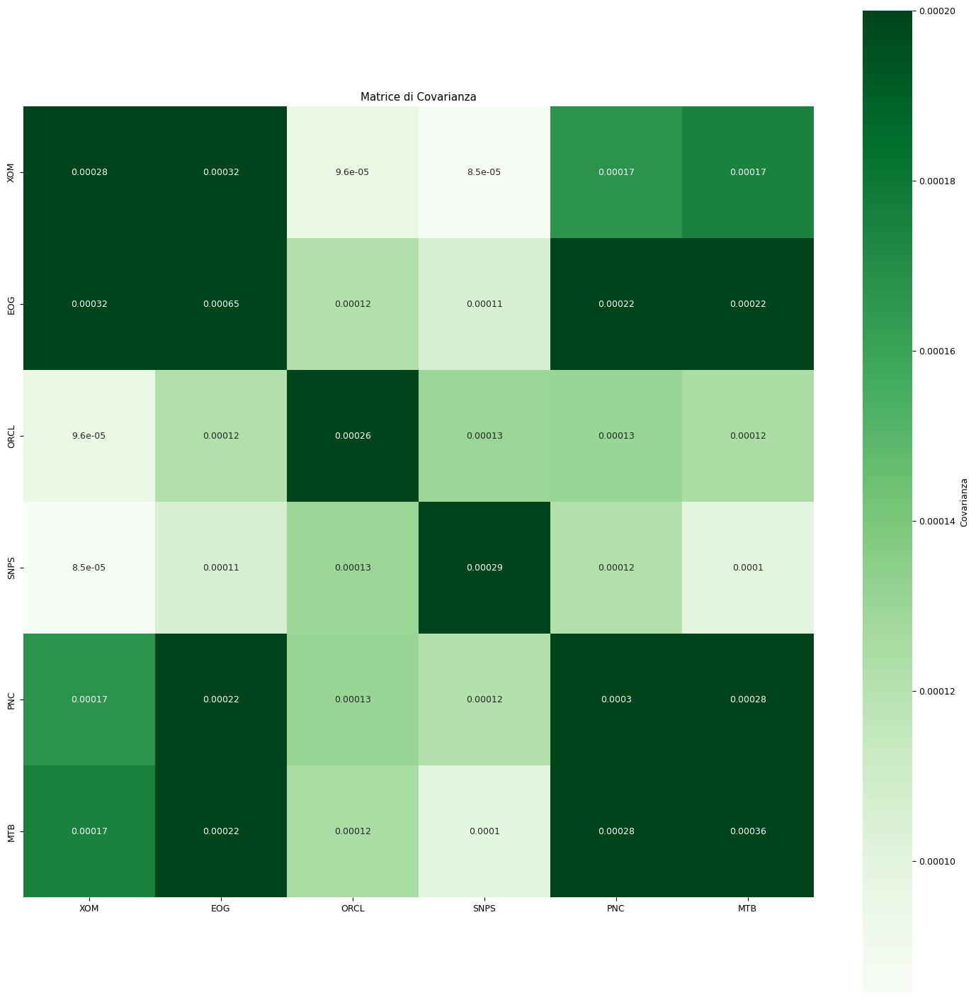

In [16]:
#matrice di Covarianza dei rendimenti
asset_cov = rl_asset.cov()
#creo la heatmap
plt.figure(figsize = (18,18))
plt.title('Matrice di Covarianza')
sns.heatmap(asset_cov, square = True, annot = True, cmap = "Greens", cbar_kws={'label':'Covarianza'}, vmax = 1/5000);


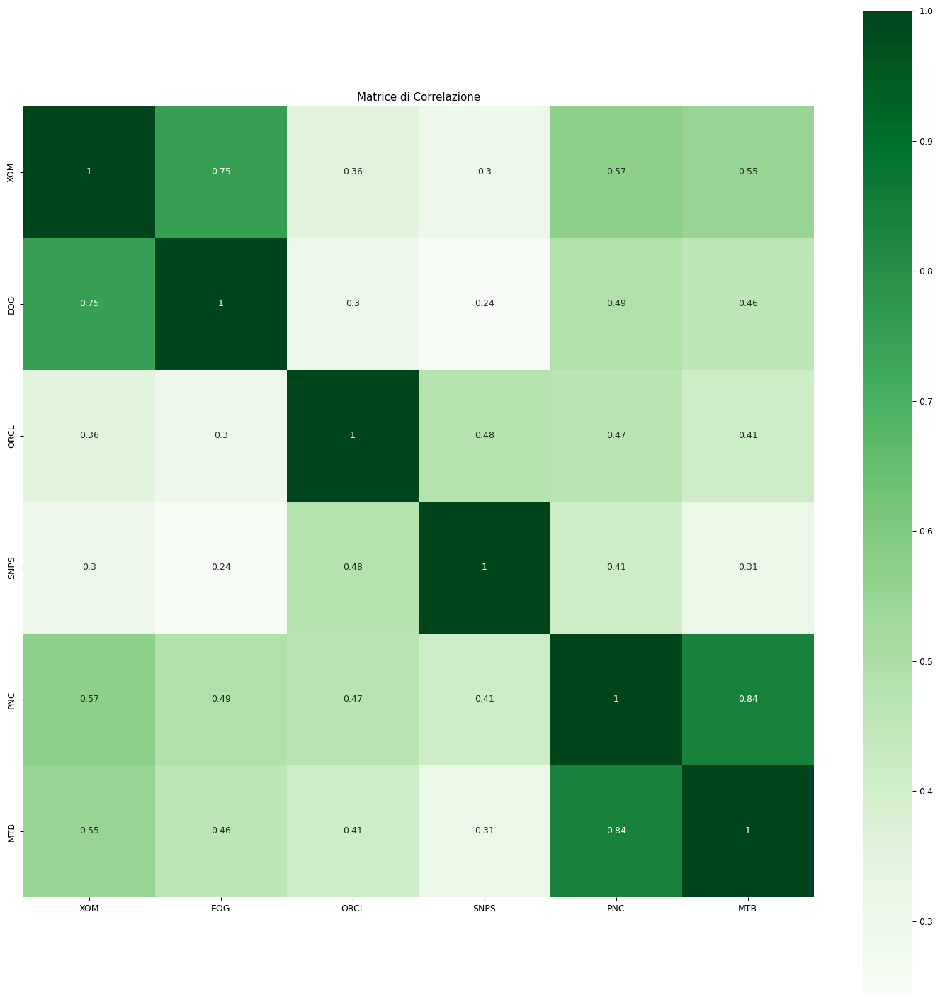

In [17]:
#matrice di correlazione
cor_asset = rl_asset.corr()
plt.figure(figsize = (18,18))
plt.title('Matrice di Correlazione')
#creo la heatmap
sns.heatmap(cor_asset, vmax = 1, square = True, annot = True, cmap = "Greens");


# 2h)  Grafici dell’andamento nel tempo delle correlazioni fra i titoli 

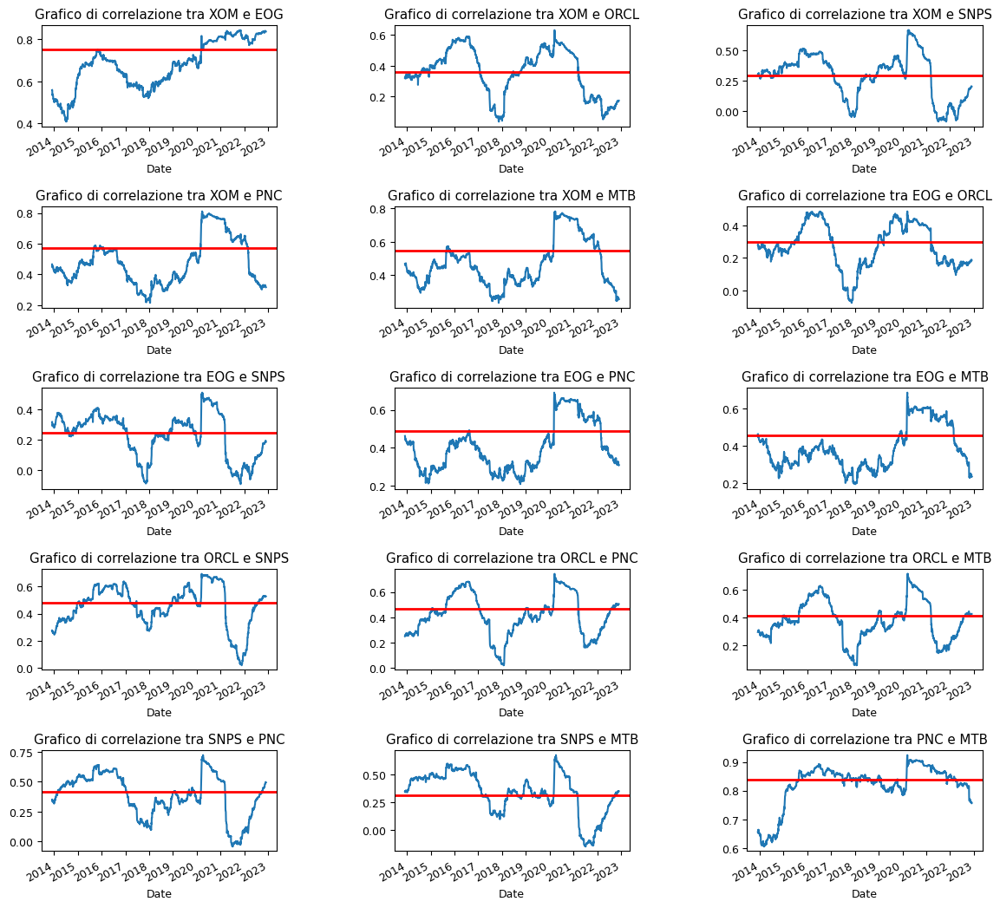

In [18]:
#creo un grafico che contiene per ogni coppia di titoli un grafico di correlazione

fig, axes = plt.subplots(nrows=5, ncols=3,figsize=(14, 14))
plt.subplots_adjust(wspace=0.5, hspace=0.8)
h = 0
k = 0
for i in range(5):    
    for j in range (3):
        if k == 6:
            h = h+1
            k = h
            
        if h == k :
            k = k+1   
        rl_asset[asset_name[h]].rolling(window=252).corr(rl_asset[asset_name[k]]).plot(ax=axes[i,j])
        axes[i, j].set_title("Grafico di correlazione tra "+ asset_name[h] +" e "+ asset_name[k]);
        axes[i, j].axhline(cor_asset.iloc[h,k], linewidth = 2, color = 'red')
        k = k+1






array([[<AxesSubplot:xlabel='XOM', ylabel='XOM'>,
        <AxesSubplot:xlabel='EOG', ylabel='XOM'>,
        <AxesSubplot:xlabel='ORCL', ylabel='XOM'>,
        <AxesSubplot:xlabel='SNPS', ylabel='XOM'>,
        <AxesSubplot:xlabel='PNC', ylabel='XOM'>,
        <AxesSubplot:xlabel='MTB', ylabel='XOM'>],
       [<AxesSubplot:xlabel='XOM', ylabel='EOG'>,
        <AxesSubplot:xlabel='EOG', ylabel='EOG'>,
        <AxesSubplot:xlabel='ORCL', ylabel='EOG'>,
        <AxesSubplot:xlabel='SNPS', ylabel='EOG'>,
        <AxesSubplot:xlabel='PNC', ylabel='EOG'>,
        <AxesSubplot:xlabel='MTB', ylabel='EOG'>],
       [<AxesSubplot:xlabel='XOM', ylabel='ORCL'>,
        <AxesSubplot:xlabel='EOG', ylabel='ORCL'>,
        <AxesSubplot:xlabel='ORCL', ylabel='ORCL'>,
        <AxesSubplot:xlabel='SNPS', ylabel='ORCL'>,
        <AxesSubplot:xlabel='PNC', ylabel='ORCL'>,
        <AxesSubplot:xlabel='MTB', ylabel='ORCL'>],
       [<AxesSubplot:xlabel='XOM', ylabel='SNPS'>,
        <AxesSubplot:xlabel='EOG',

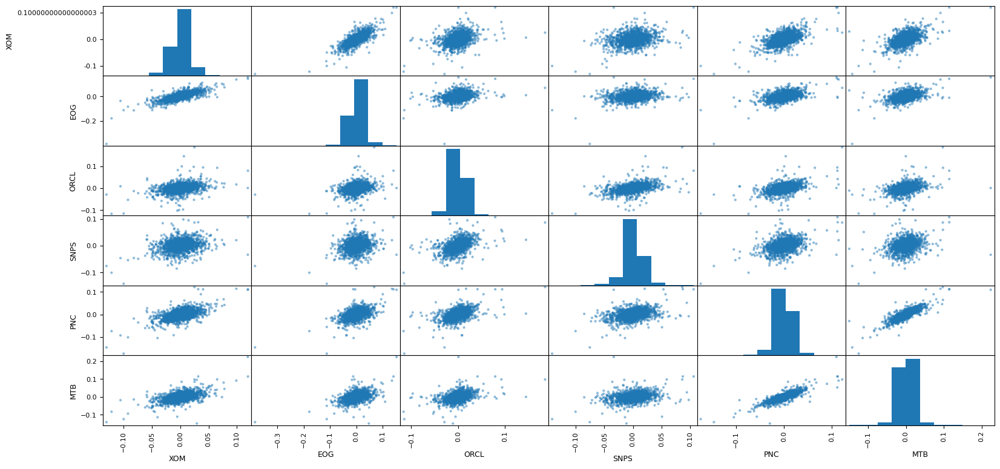

In [19]:
#creo una matrice di scatter plot di correlazione
pd.plotting.scatter_matrix(rl_asset, alpha=0.5, figsize=(19,9), ax=None, grid= True, 
                               diagonal='hist', marker='.', density_kwds=None, 
                               hist_kwds=None, range_padding=0.05)

# 3) ANALISI DI PREVISIONE

# 3a) Modello di previsione arima

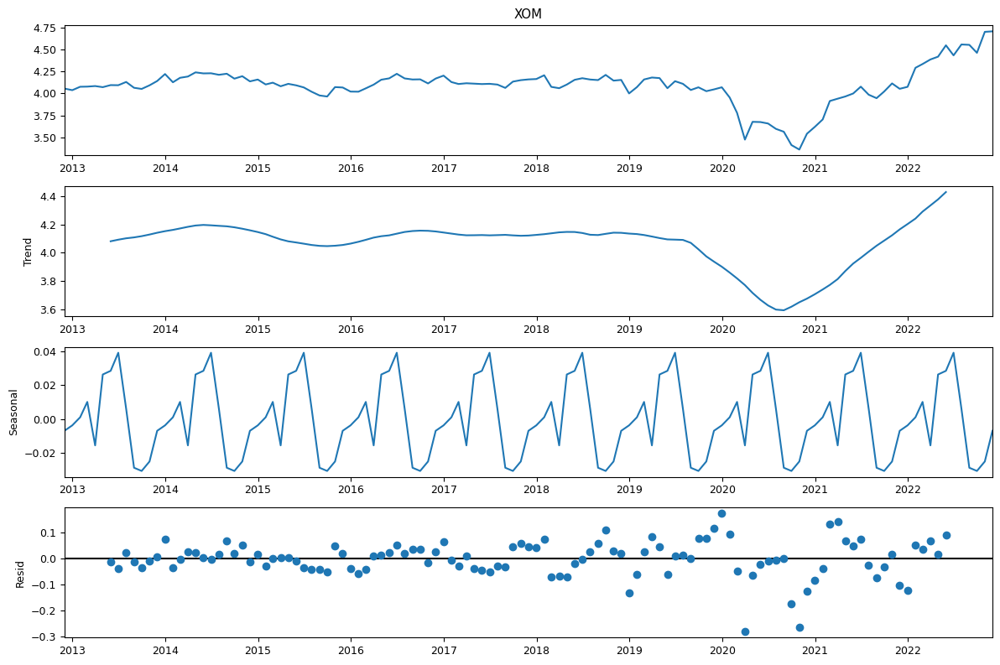

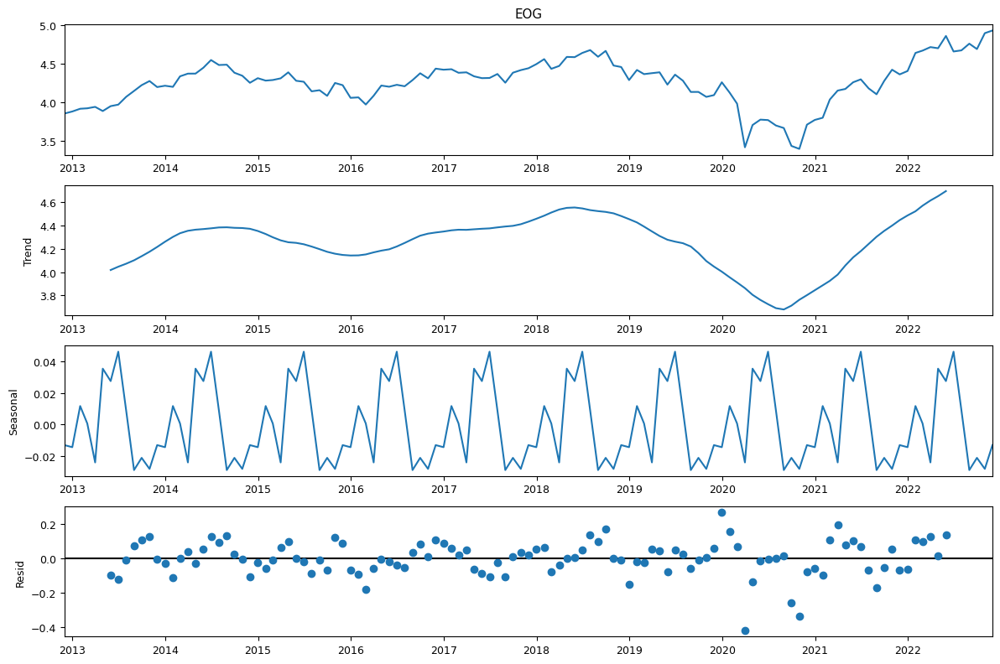

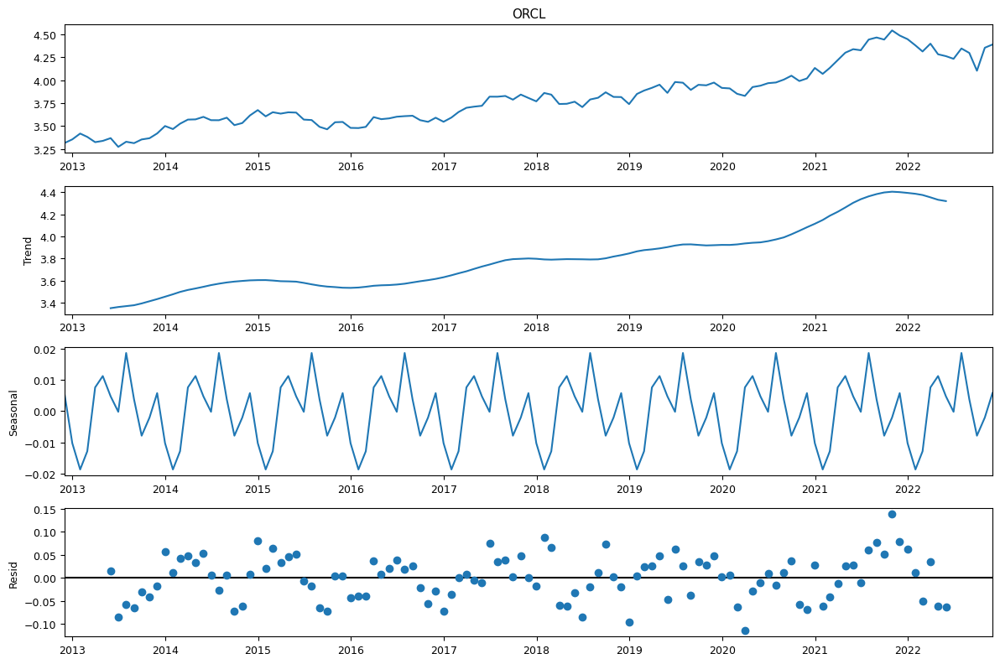

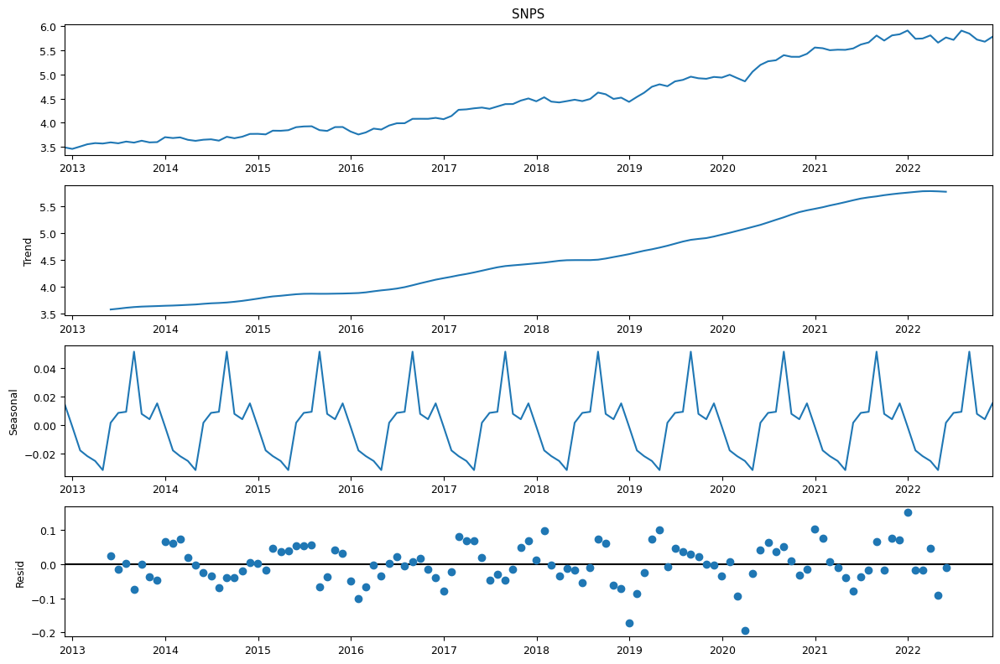

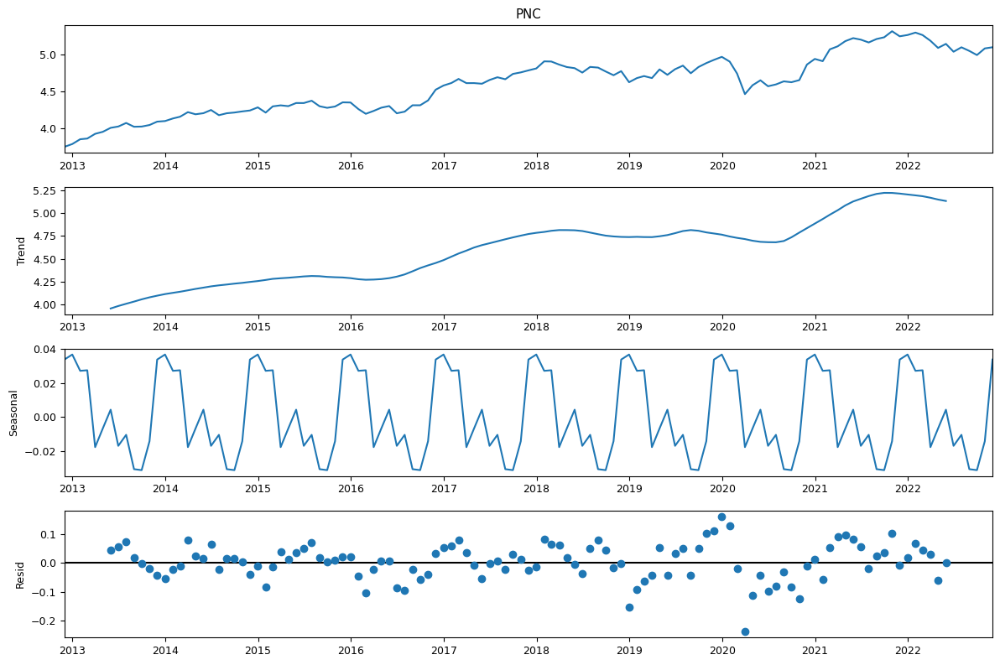

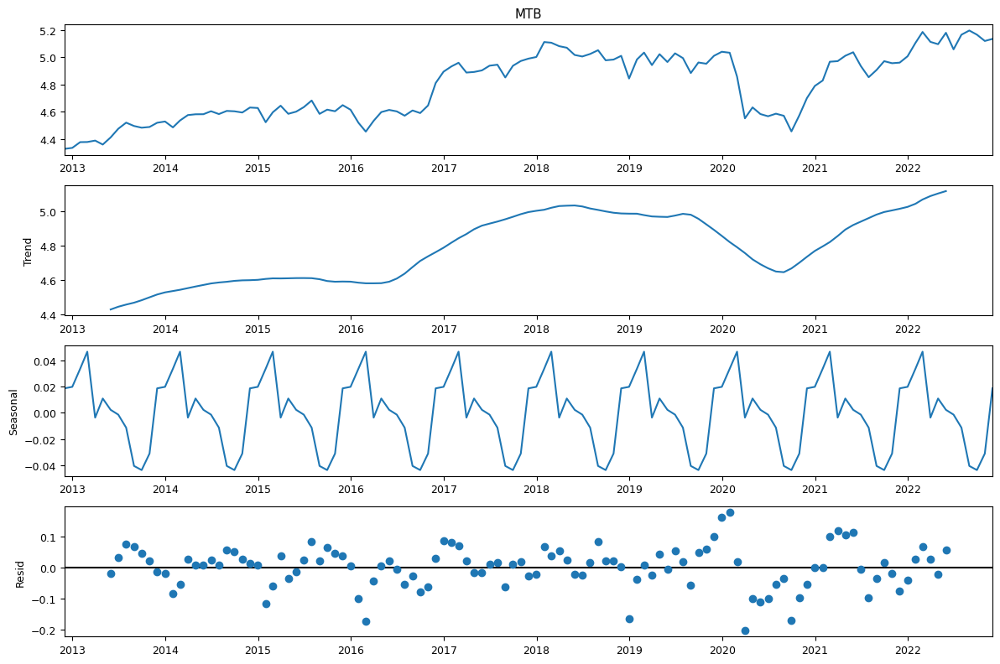

In [20]:
#scomposizione per vedere se sono stagionali
adj_close_asset_month = adj_close_asset.resample("M").last().dropna()
for asset in asset_name:
    asset_log_month = np.log(adj_close_asset_month[asset])
    result_decomp = seasonalDecompose(asset_log_month.dropna())
    plt.rcParams['figure.figsize'] = (12,8)
    fig = result_decomp.plot()

In [21]:
#definisco la funzione arima_grid_search per trovare i parametri che poi andrò ad utilizzare nel modello
#arima grid search 
def arima_grid_search(dataframe, s):
    ## Definisco i possibli valori per i parametri p,d,q di SARIMA
    p = [0, 1, 2]
    d = q = range(0,2)
    
    #genero tutte le combinazioni di parametri
    param_combinations = list(itertools.product(p, d, q))
    lowest_aic, pdq, pdqs = None, None, None
    total_iterations = 0
    
    #itero in tutte le combinazioni di parametri per trovare quella che mi serve per il modello
    for order in param_combinations:
        for (p, q, d) in param_combinations:
            seasonal_order = (p, q, d, s)
            total_iterations += 1
            try:
                #provo a creare un modello sarimax con questi parametri 
                model = SARIMAX(dataframe, order = order,
                               seasonal_order= seasonal_order,
                               enforce_stationarity=False,
                               enforce_invertibility=False,
                               disp = False
                               )
                model_result = model.fit(maxiter=200, disp=False)
                
                #aggiorno i dati se necessario
                if not lowest_aic or model_result.aic < lowest_aic:
                    lowest_aic = model_result.aic
                    pdq, pdqs = order, seasonal_order
            
            #genero eccezzioni in caso di errore
            except Exception as ex:
                continue       
    return lowest_aic, pdq, pdqs





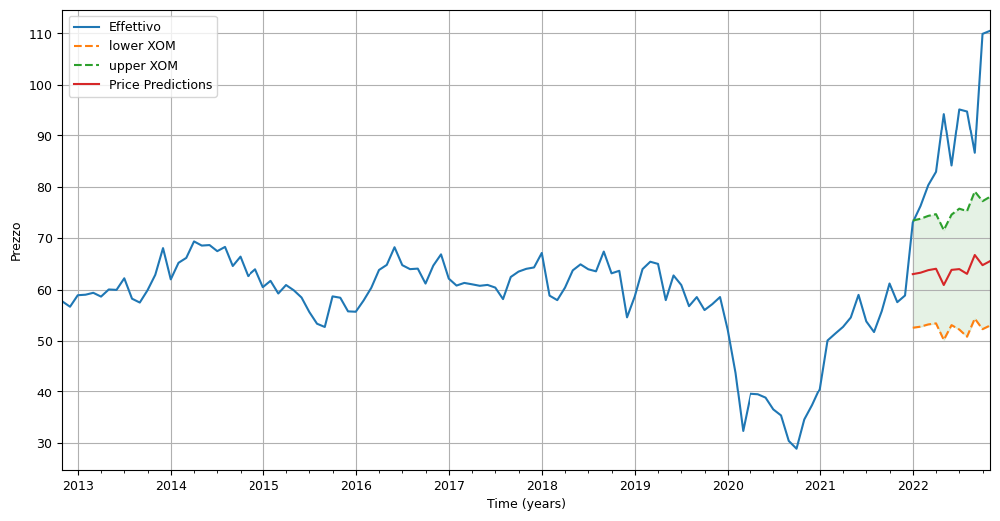

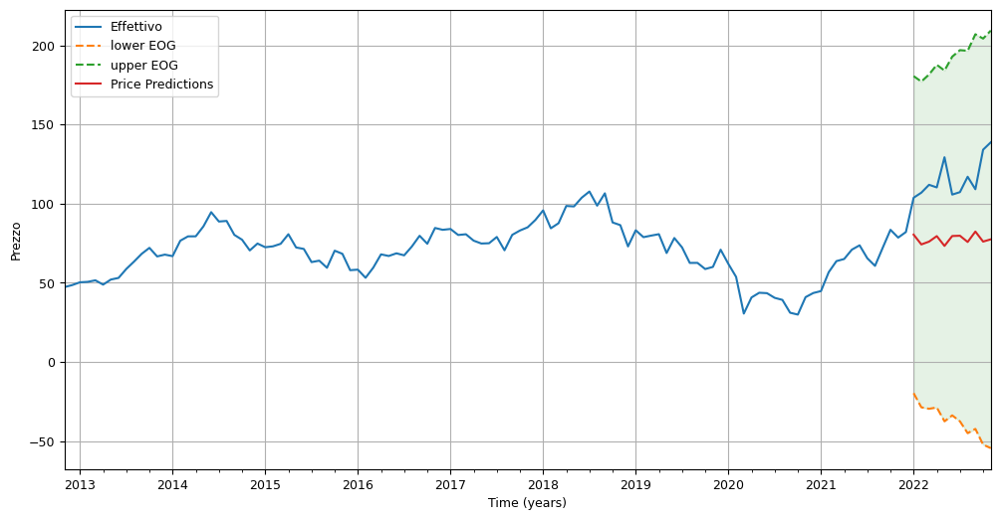

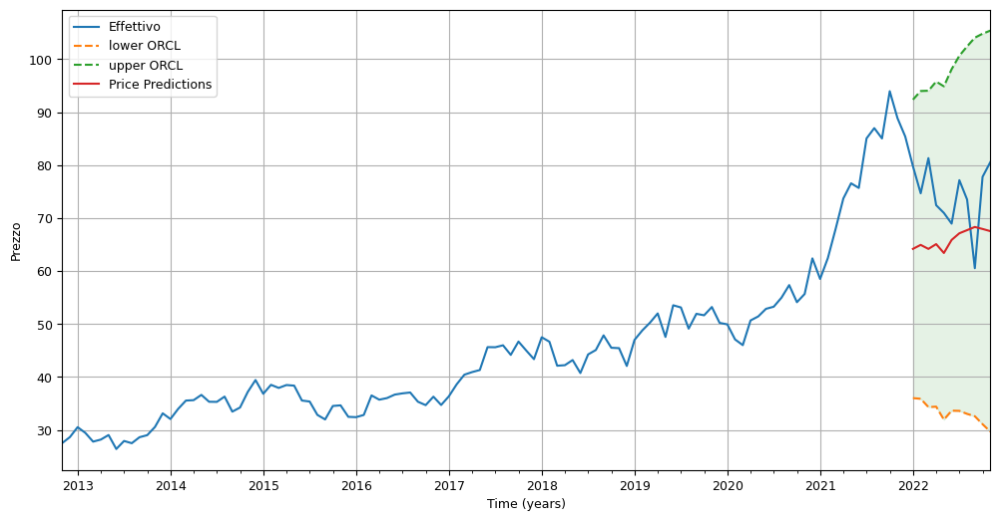

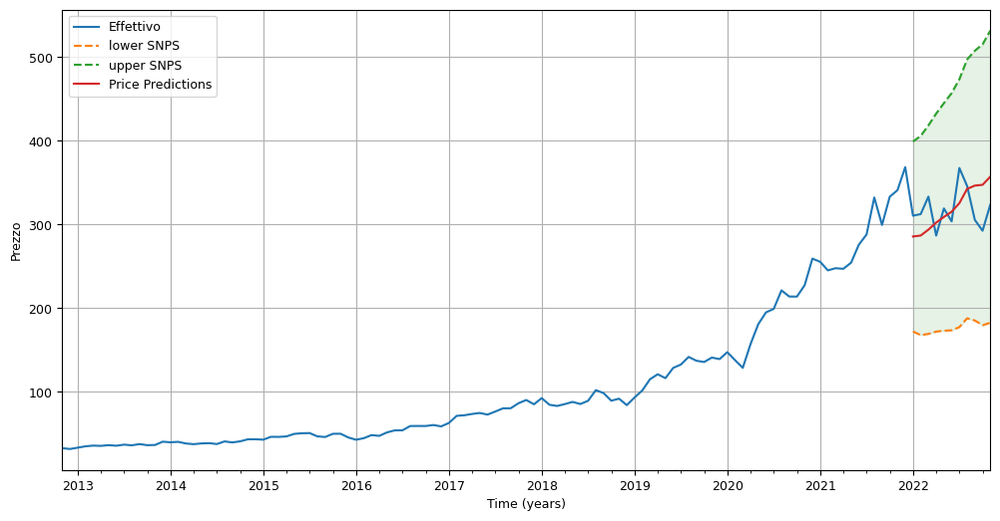

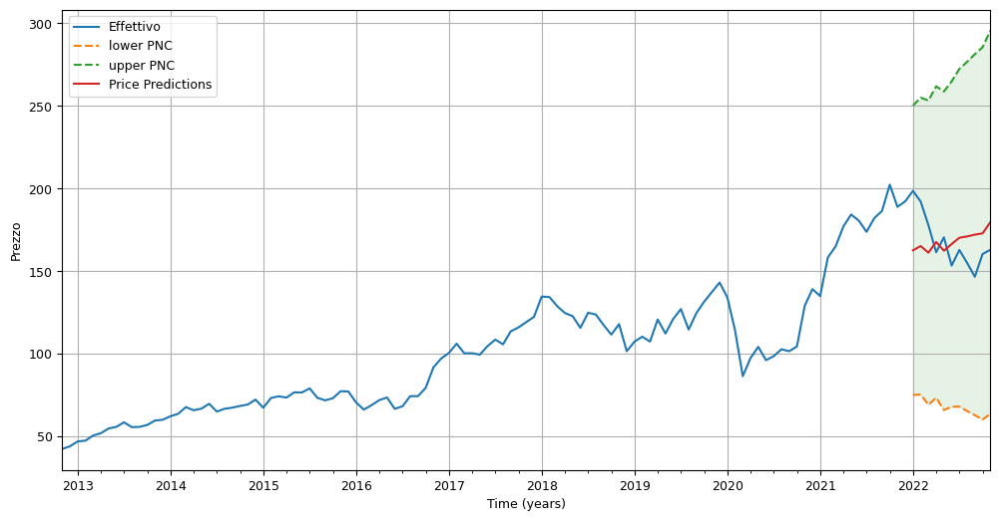

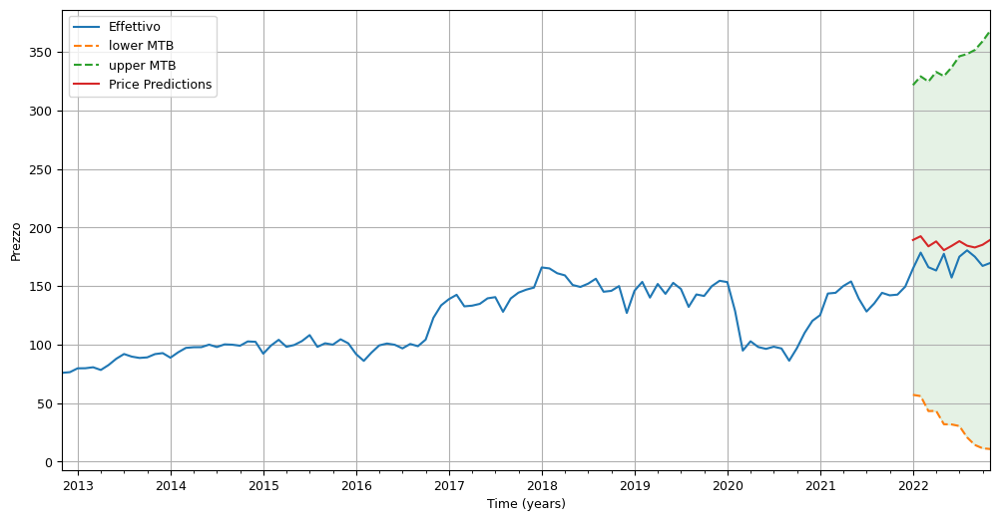

In [22]:
#creo un modello sarimax per ogni asset che sto analizzando 
warnings.filterwarnings("ignore")
for asset in adj_close_asset:
    settle_adj_close_asset=adj_close_asset[asset].resample("M").last()
    
    #creo i train_set e validation_set
    train_set = settle_adj_close_asset.iloc[0:80]
    validation_set = settle_adj_close_asset.iloc[80:110]
    
    #utilizzo il metodo creato precedemente per ottenere i parametri per sarimax
    lowest_aic, order, seasonal_order = arima_grid_search((pd.concat([train_set, validation_set])).values, 12)
    
    #creo il modello sarimax con i miglior parametri
    model = SARIMAX(train_set, order = order,
                                seasonal_order= seasonal_order,
                                enforce_stationarity=False,
                                enforce_invertibility=False,
                                disp = False
                                )
    model_results = model.fit(maxiter=200, disp=False)
    
    #faccio una predizione per i prossimi 10 mesi
    n = len((pd.concat([train_set, validation_set])).index)
    prediction = model_results.get_prediction(start=n, end = n+10)
    price_predict = model_results.predict(n, n+10)

    #calcolo l'intervallo di confidenza per la predizione
    prediction_confid = prediction.conf_int()

    plt.figure(figsize=(12,6))

    ax = settle_adj_close_asset.plot(label = 'Effettivo')
    prediction_confid.plot(ax=ax, style = ['--', '--'],
                    label = 'predicted/forecasted')
    price_predict.plot(legend=True, label="Price Predictions")

    index_confid= prediction_confid.index
    lower_confid = prediction_confid.iloc[:,0]
    upper_confid = prediction_confid.iloc[:,1]

    ax.fill_between(index_confid, lower_confid, upper_confid, color = 'g', alpha = 0.1)
    ax.set_xlabel('Time (years)')
    ax.set_ylabel('Prezzo')
    plt.grid()
    plt.legend()
    plt.show()




# 4)STRATEGIE DI TRADING E BACKTESTING


## 4a) Strategia Moving Avarages Convergence Divergence (MACD)

In [23]:

#creo una funzione che utilizzerò successivamente per stampare i grafici dei confronti tra stretegie 
def printGraficoConfronto(asset):
    plt.figure(figsize=(16,9))
    ax1 = plt.subplot2grid((10,1), (0,0), rowspan = 4, colspan = 1, title = asset)
    ax2 = plt.subplot2grid((10,1), (5,0), rowspan = 2, colspan = 1, sharex = ax1)
    ax3 = plt.subplot2grid((10,1), (8,0), rowspan = 2, colspan = 1, sharex = ax1)
    ax1.plot(strategy_df_asset['Adj Close'], label = 'Price')
    ax1.plot(strategy_df_asset['SMA20'], label = 'SMA20')
    ax1.plot(strategy_df_asset['SMA120'], label = 'SMA120')
    ax1.plot(strategy_df_asset['EWM12'], label = 'EWM12')
    ax1.plot(strategy_df_asset['EWM26'], label = 'EWM26')

    ax2.bar(strategy_df_asset.index, strategy_df_asset['Volume'], label = 'Volume')
    ax3.plot(strategy_df_asset['Buy_and_hold'], label = 'Buy and hold')
    ax3.plot(sma['Return'], label = 'SMA')
    ax3.plot(ewm['Return'], label ='EWM')
    
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax3.set_xlabel('Date (Year - month)')
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plt.show()

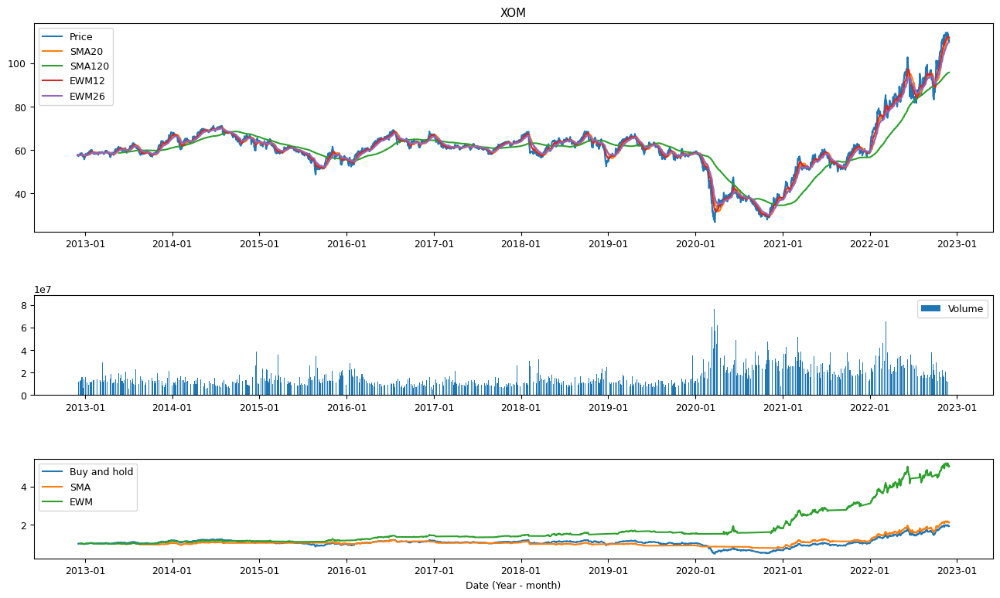

rendimento strategia Buy and hold  XOM: 1.9154346268834044
rendimento SMA XOM: 2.110189199418346
rendimento EWM XOM: 5.061804129382499


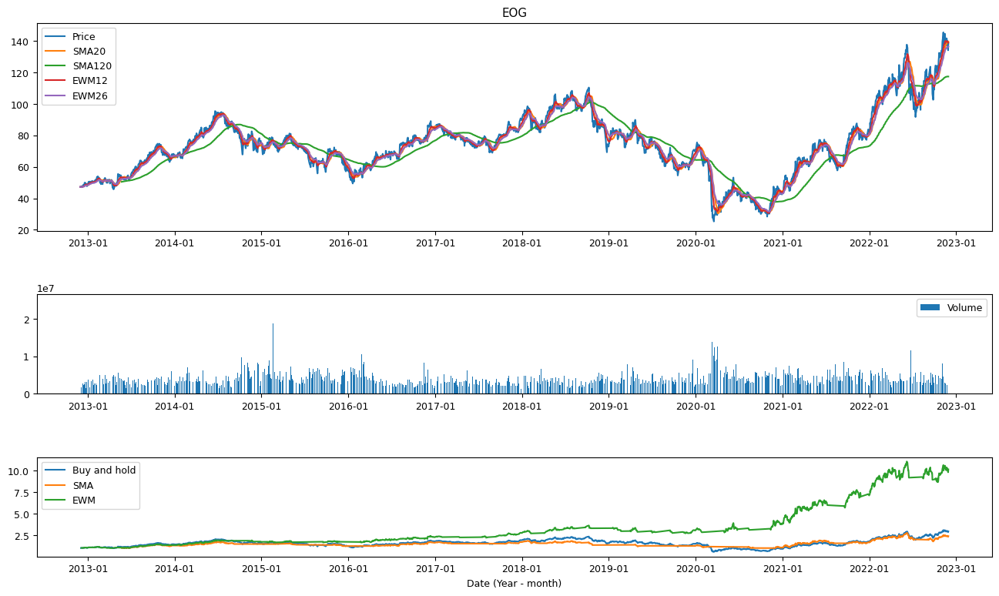

rendimento strategia Buy and hold  EOG: 2.9367550915868867
rendimento SMA EOG: 2.3792528325209195
rendimento EWM EOG: 10.150299958326496


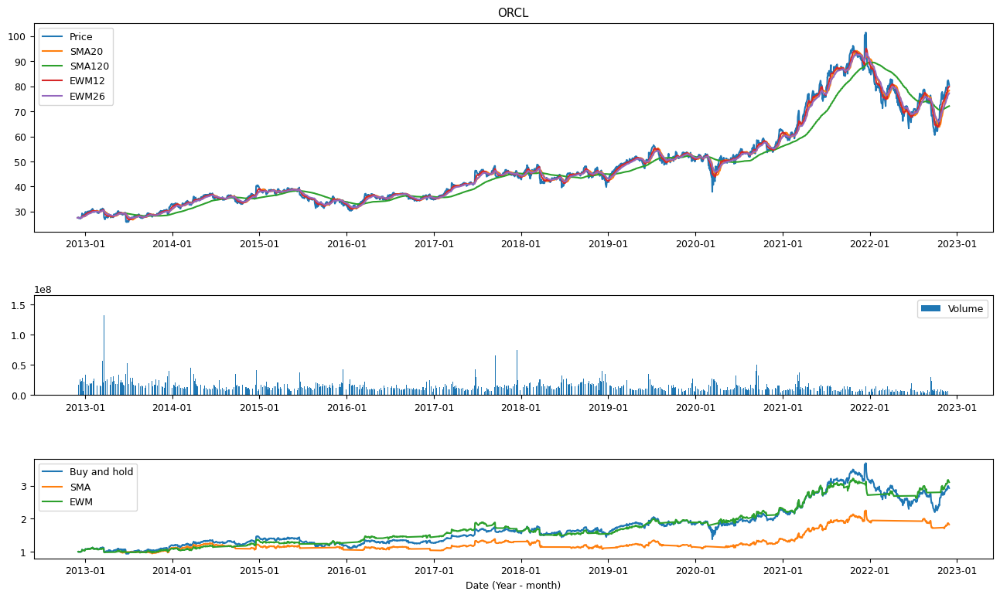

rendimento strategia Buy and hold  ORCL: 2.928209439313667
rendimento SMA ORCL: 1.82628217209243
rendimento EWM ORCL: 3.1085506095909707


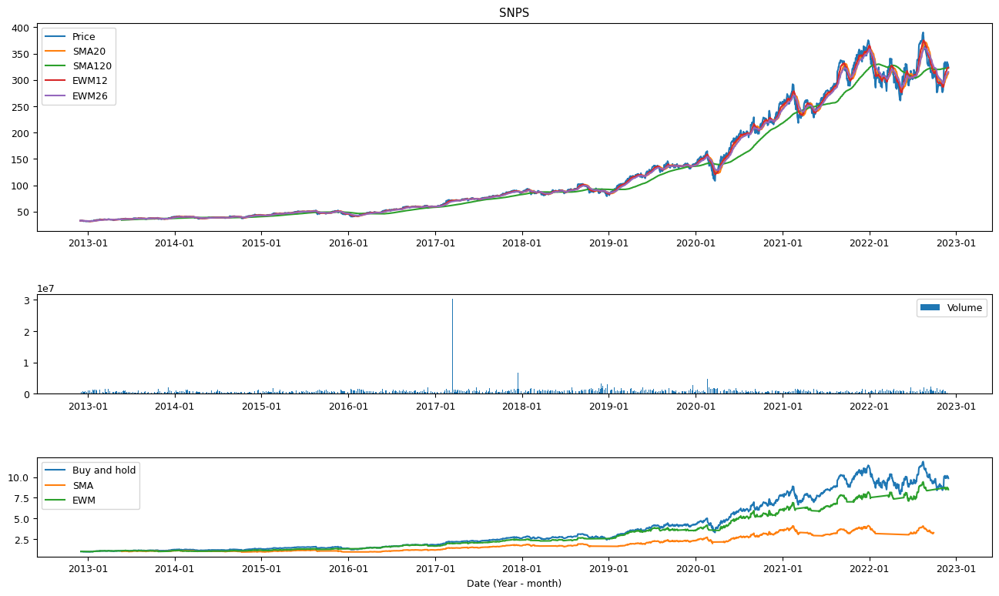

rendimento strategia Buy and hold  SNPS: 9.849665174995486
rendimento SMA SNPS: 3.275477810008495
rendimento EWM SNPS: 8.487963575076959


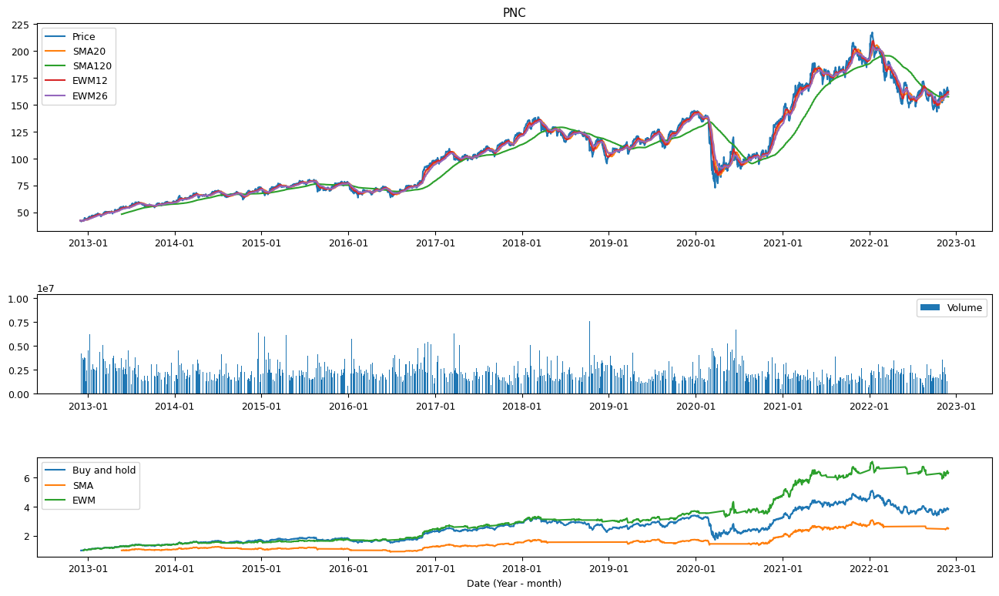

rendimento strategia Buy and hold  PNC: 3.8422593542581396
rendimento SMA PNC: 2.50639910922573
rendimento EWM PNC: 6.343393865391207


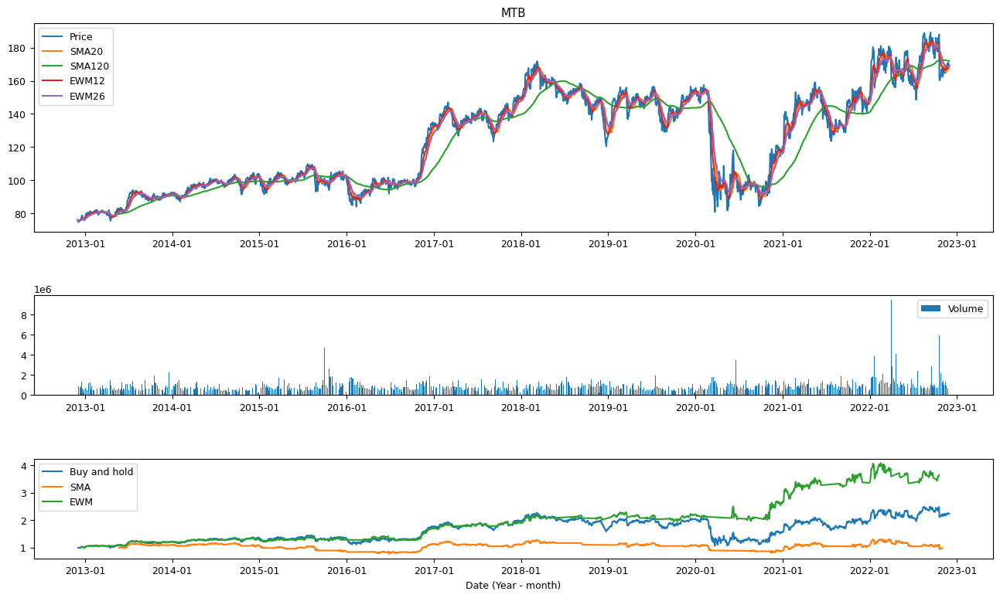

rendimento strategia Buy and hold  MTB: 2.237855364716801
rendimento SMA MTB: 0.9849251037254682
rendimento EWM MTB: 3.639859226002554


In [24]:


#uso un for per creare la strategia su tutti i titoli presi in considerazione
i = 0
for asset in asset_name:
    
    
    strategy_df_asset = list_df_asset[i].drop(columns = ['High', 'Low', 'Open', 'Close'])
    #creo le due serie mobili da 20 giorni e 120 giorni
    strategy_df_asset['SMA20'] = strategy_df_asset['Adj Close'].rolling(20).mean()
    strategy_df_asset['SMA120'] = strategy_df_asset['Adj Close'].rolling(120).mean()
    
    #creo le medie mobili esponenziali
    strategy_df_asset['EWM12'] = strategy_df_asset['Adj Close'].ewm(span=12, adjust=False).mean()
    strategy_df_asset['EWM26'] = strategy_df_asset['Adj Close'].ewm(span=26, adjust=False).mean()
    #creo la strategia MACDA, creando SMA e EWM
    strategy_df_asset['Price_yesterday'] = strategy_df_asset['Adj Close'].shift(1)
    strategy_df_asset['Change'] = strategy_df_asset['Adj Close'] / strategy_df_asset['Price_yesterday']
    strategy_df_asset['Invested_SMA'] = [1 if strategy_df_asset.loc[i, 'SMA20'] > strategy_df_asset.loc[i, 'SMA120'] 
                        else 0 for i in strategy_df_asset.index]
    strategy_df_asset['Invested_EWM'] = [1 if strategy_df_asset.loc[i, 'EWM12'] > strategy_df_asset.loc[i, 'EWM26'] 
                        else 0 for i in strategy_df_asset.index]
    
    #preparo il buy and hold per il punto 4b)    
    #creo Buy and hold e calcolo rendimento 
    strategy_df_asset['Buy_and_hold'] = np.cumprod(strategy_df_asset['Change'])
    
    #rendimento SMA
    sma = strategy_df_asset[strategy_df_asset['Invested_SMA'] == 1]
    sma['Return'] = np.cumprod(sma['Change'])
    #rendimento EWM
    ewm = strategy_df_asset[strategy_df_asset['Invested_EWM'] == 1]
    ewm['Return'] = np.cumprod(ewm['Change'])
    
    #stampo i vari grafici di confronto
    printGraficoConfronto(asset)
    #stampo i rendimenti delle strategie  nel periodo
    print('rendimento strategia Buy and hold  ' + asset + ': '+   str(strategy_df_asset['Buy_and_hold'][-1]))
    print('rendimento SMA ' + asset + ': ' + str(sma['Return'][-1]))
    print('rendimento EWM ' + asset + ': ' + str(ewm['Return'][-1]))

    i = i+1

## 4c) Andamento indice con Google trend

In [25]:
#utilizzo la libreria pytrends
pytrends = TrendReq(hl='en-US')
keywords = []
timeframes = ['today 5-y', 'today 12-m',
              'today 3m', 'today 1-m']

cat='0'
geo = ''
gprop = ''

def check_trends():
    pytrends.build_payload(keywords,
                       cat,
                       timeframes[0],
                       geo,
                       gprop)

    data = pytrends.interest_over_time()
    mediaT = round(data.mean(),2)
    media_ultimo_anno = round(data[asset][-52:].mean(),2) #Media dell'ultimo anno
    media5anni = round(data[asset][:52].mean(),2) #Media annuale di cinque anni fa
    trend = round(((media_ultimo_anno/mediaT[asset])-1)*100, 2)
    trend2 = round(((media_ultimo_anno/media5anni)-1)*100,2) 
    print("L'interesse medio negli ultimi cinque anni per " + asset  + ' è stato ' + str(mediaT[asset]))
    print("L'interesse medio nell'ultimo anno per " + asset  +
          ' a confronto con gli ultimi 5 anni è cambiato del ' + 
          str(trend) + '%.')
    #Trend stabile
    if mediaT[asset] > 75 and abs(trend) <= 5:
        print("L'interesse per " +  asset + ' è stabile negli ultimi 5 anni.')
    elif mediaT[asset] > 75 and trend > 5:
        print("L'interesse per " +  asset + ' è stabile e crescente negli ultimi 5 anni.')
    elif mediaT[asset] > 75 and trend < -5:
        print("L'interesse per " +  asset +  'è stabile e decrescente negli ultimi 5 anni.')
     #Trend relativamente stabile
    elif mediaT[asset] > 60 and abs(trend) <= 15:
        print("L'interesse per " +  asset + ' è relativamente stabile negli ultimi 5 anni.')
    elif mediaT[asset] > 60 and trend > 15:
        print("L'interesse per " +  asset + ' è relativamente stabile e crescente negli ultimi 5 anni.')   
    elif mediaT[asset] > 60 and trend < -15:
        print("L'interesse per " +  asset + ' è relativamente stabile e decrescente negli ultimi 5 anni')   

     #Cicli stagionali
    elif mediaT[asset] > 20 and abs(trend) <= 15:
        print("L'interesse per " +  asset + ' è stagionale.')
    
    #Nuovo termine/prodotto
    elif mediaT[asset] > 20 and trend < 15:
        print("L'interesse per " +  asset + ' è con trend positivo.')
    
    #Prodotto o termine in declino
    elif mediaT[asset] > 20 and trend < -15:
        print("L'interesse per " +  asset + ' ha un trend negativo.')
    
    #Prodotto o termine ciclico
    elif mediaT[asset] > 5 and abs(trend) <= 15:
        print("L'interesse per " +  asset + ' è ciclico.')
    
    #Prodotto nuovo
    elif mediaT[asset] > 0 and trend > 15:
        print("L'interesse per " +  asset + ' è nuovo e con trend positivo.')
    
    #Prodotto in declino
    elif mediaT[asset] > 0 and trend < -15:
        print("L'interesse per " +  asset + ' è in declino.')
    
    #Other
    else:
        print('Occorre fare altre verifiche')
        
    # Confronto con 5 anni fa
    if media5anni == 0:
        print("Il prodotto/termine non esisteva 5 anni fa")
    elif trend2 >15:
        print("L'interesse nell'ultimo anno è stato molto più alto rispetto a 5 anni fa." + 
             "E' aumentato del " + str(trend2) + '%.')
    elif trend2 <15:
        print("L'interesse nell'ultimo anno è stato molto più basso rispetto a 5 anni fa." + 
             "E' diminuito del " + str(trend2) + '%.')
    else:
        print("l'interesse nell'ultimo anno è paragonabile a quello di 5 anni fa." + 
             "La variazione è stata del " + str(trend2) + '%.')
        
    print('')
        
        
for asset in asset_name:
    keywords.append(asset)
    check_trends()
    keywords.pop()

L'interesse medio negli ultimi cinque anni per XOM è stato 45.59
L'interesse medio nell'ultimo anno per XOM a confronto con gli ultimi 5 anni è cambiato del -6.6%.
L'interesse per XOM è stagionale.
L'interesse nell'ultimo anno è stato molto più basso rispetto a 5 anni fa.E' diminuito del 5.03%.

L'interesse medio negli ultimi cinque anni per EOG è stato 25.2
L'interesse medio nell'ultimo anno per EOG a confronto con gli ultimi 5 anni è cambiato del 10.04%.
L'interesse per EOG è stagionale.
L'interesse nell'ultimo anno è stato molto più basso rispetto a 5 anni fa.E' diminuito del -0.61%.

L'interesse medio negli ultimi cinque anni per ORCL è stato 20.97
L'interesse medio nell'ultimo anno per ORCL a confronto con gli ultimi 5 anni è cambiato del -4.15%.
L'interesse per ORCL è stagionale.
L'interesse nell'ultimo anno è stato molto più basso rispetto a 5 anni fa.E' diminuito del -10.75%.

L'interesse medio negli ultimi cinque anni per SNPS è stato 63.62
L'interesse medio nell'ultimo anno p

# 5)CAPM

## 5a) Calcolo beta

In [26]:
#CAPM

#definisco una funzione per calcolare il beta
def calcola_beta(list_df_asset):
    i = 0
    for i in range(6):   
        #calcolo il rendimento dell'asset
        df_month_b= list_df_asset[i].pct_change().dropna()
        df_month_b.head()
        #creo un dataframe con il mio asset e l'sp500
        concat_asset_sp500 = pd.concat([df_month_b,sp500dfMonth],axis = 1)
        concat_asset_sp500.columns = [asset_name[i],"SP500"]
        
        #calcolo la covarianza e il benchmark_variance
        covariance = concat_asset_sp500.cov().iloc[0,1]
        bm_variance = concat_asset_sp500["SP500"].var()
        
        #calcolo beta
        beta.append(covariance / bm_variance)
        print("il beta di",asset_name[i]," e': ",beta[i])
        i = i+1
        
#importo i dati dell'sp500 e calcolo i rendimenti
sp500dfMonth = yf.download("^GSPC", start = start_date, end = end_date)["Adj Close"].resample("M").last().pct_change().dropna()


beta = []

calcola_beta(list_df_month)



[*********************100%***********************]  1 of 1 completed
il beta di XOM  e':  1.0742623562205698
il beta di EOG  e':  1.4328588976885008
il beta di ORCL  e':  1.036121349380372
il beta di SNPS  e':  1.1379406325803212
il beta di PNC  e':  1.1139034184752137
il beta di MTB  e':  0.8060168757274762


## 5b) Esposizione Fama-French

In [27]:
i = 0
#carico i dati dal file csv dei vari fattori
factor_df = pd.read_csv('F-F_Research_Data_Factors.csv', skiprows=3)

#elimino i dati in fondo al file
stringa = ' Annual Factors: January-December '
indices = factor_df.iloc[:,0] == stringa
start_of_annual = factor_df[indices].index[0]
factor_df = factor_df[factor_df.index < start_of_annual]
factor_df.columns = ['data', 'mkt', 'smb', 'hml', 'rf']
factor_df['data'] = pd.to_datetime(factor_df['data'], format='%Y%m').dt.strftime("%Y-%m")
factor_df = factor_df.set_index('data')
factor_df = factor_df[start_date:end_date]
factor_df = factor_df.apply(pd.to_numeric, errors='coerce').div(100)

#per ogni azione, ricalcolo il rendimento e poi l'esposizione e fama french
for i in range(6):
    asset_df = list_df_asset[i]
    y = asset_df['Adj Close'].resample('M').last().pct_change().dropna()

    y.index = y.index.strftime('%Y-%m')
    y.name = 'rtn'
    ff_data = factor_df.join(y)
    ff_data['excess_rtn'] = ff_data.rtn - ff_data.rf
    ff_model = smf.ols(formula = 'excess_rtn ~ mkt + smb + hml', data = ff_data).fit()
    print("Esposizione a Fama French di: ",asset_name[i])
    print(ff_model.summary())
    asset_df.head()

Esposizione a Fama French di:  XOM
                            OLS Regression Results                            
Dep. Variable:             excess_rtn   R-squared:                       0.603
Model:                            OLS   Adj. R-squared:                  0.593
Method:                 Least Squares   F-statistic:                     58.21
Date:                Mon, 06 Feb 2023   Prob (F-statistic):           5.76e-23
Time:                        14:11:58   Log-Likelihood:                 191.29
No. Observations:                 119   AIC:                            -374.6
Df Residuals:                     115   BIC:                            -363.5
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.

## 5c) Calcolo rendimento atteso annuo

In [28]:
#calcolo il rendimento atteso annuo di ogni asset usando la formula
rend_at = []
i = 0
for asset in asset_name :
    rendimento_atteso = factor_df['rf'].mean() + beta[i] * (factor_df['mkt'].mean() - factor_df['rf'].mean())*12
    print("Il rendimento atteso annuo di",asset,"e': ",rendimento_atteso)
    rend_at.append(rendimento_atteso)
    i = i+1


Il rendimento atteso annuo di XOM e':  0.12811339863763901
Il rendimento atteso annuo di EOG e':  0.17070381946529573
Il rendimento atteso annuo di ORCL e':  0.12358340087060861
Il rendimento atteso annuo di SNPS e':  0.1356764514675397
Il rendimento atteso annuo di PNC e':  0.13282155760807796
Il rendimento atteso annuo di MTB e':  0.09625395054438533


# 6) COSTRUZIONE DI PORTAFOGLIO

## 6a) Metodo simulato Rendimenti storici



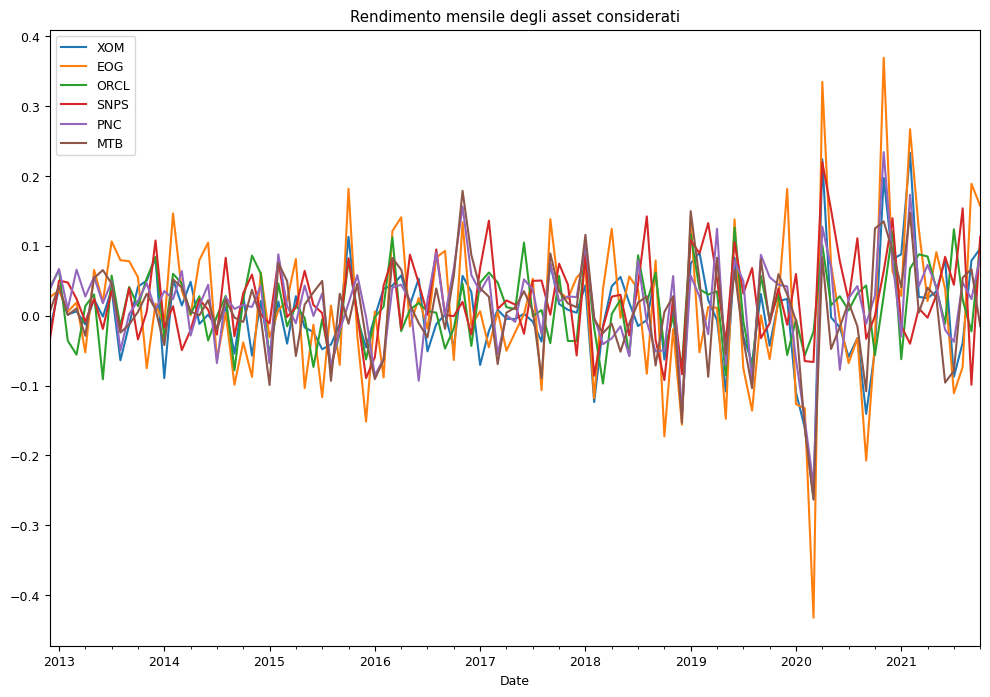

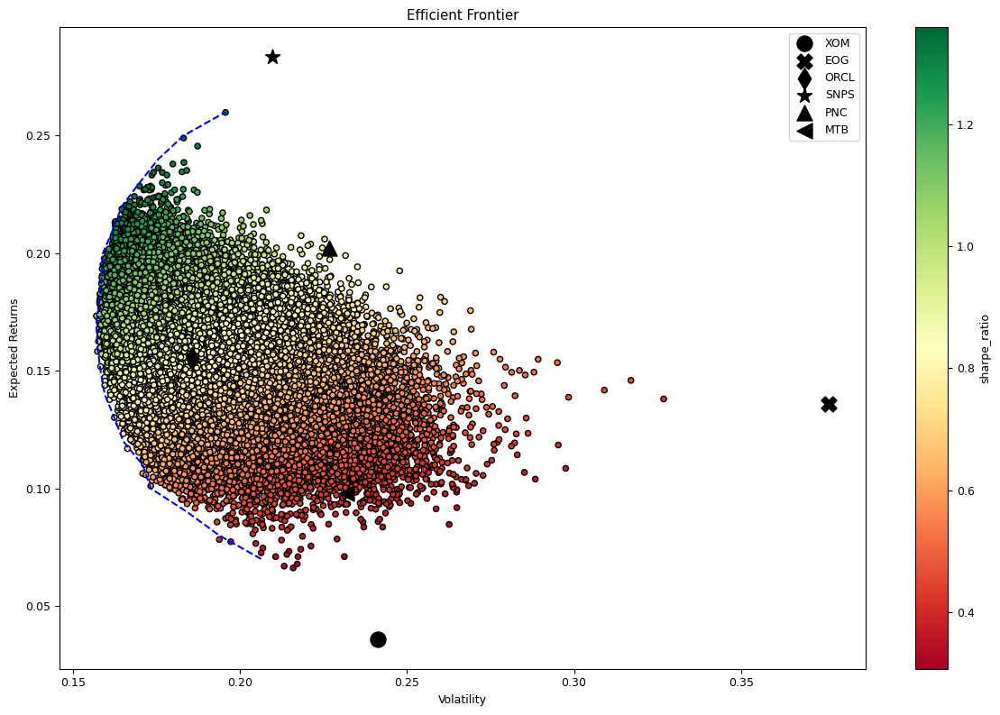

In [29]:

#costruzione portafoglio

df108 = adj_close_asset.resample("M").last().iloc[:108]
n_month = 108
n_port = 10 ** 5
n_assets = 6
return_108m_asset = df108.pct_change().dropna()
mat_cov = return_108m_asset.cov()*12
avg_returns = return_108m_asset.mean() * 12
return_108m_asset.plot(title='Rendimento mensile degli asset considerati');


#simulazione
np.random.seed(42)
weights_s_s = np.random.random(size=(n_port, n_assets))
weights_s_s /=  np.sum(weights_s_s, axis=1)[:, np.newaxis]

#calcolo rendimenti portafoglio
portf_rtns_s_s = np.dot(weights_s_s, avg_returns)
portf_vol_s_s = []
for i in range(0, len(weights_s_s)):
    portf_vol_s_s.append(np.sqrt(np.dot(weights_s_s[i].T, 
                                    np.dot(mat_cov, weights_s_s[i]))))
portf_vol_s_s = np.array(portf_vol_s_s)  
portf_sharpe_ratio_s_s = portf_rtns_s_s / portf_vol_s_s

portf_results_df_s_s = pd.DataFrame({'returns': portf_rtns_s_s,
                                 'volatility': portf_vol_s_s,
                                 'sharpe_ratio': portf_sharpe_ratio_s_s})

#creo la frontiera efficiente
n_points = 100
portf_vol_ef_s_s = []
indices_to_skip = []

portf_rtns_ef_s_s = np.linspace(portf_results_df_s_s.returns.min(), 
                            portf_results_df_s_s.returns.max(), 
                           n_points)
portf_rtns_ef_s_s = np.round(portf_rtns_ef_s_s, 2)    
portf_rtns_s_s = np.round(portf_rtns_s_s, 2)

#Per ogni punto nella frontiera efficiente, cerco l'indice di rendimento corrispondente nel portafoglio.
for point_index in range(n_points):
    if portf_rtns_ef_s_s[point_index] not in portf_rtns_s_s:
        indices_to_skip.append(point_index)
        continue
    matched_ind = np.where(portf_rtns_s_s == portf_rtns_ef_s_s[point_index])
    portf_vol_ef_s_s.append(np.min(portf_vol_s_s[matched_ind]))
    
# Cancella gli indici da saltare dalla frontiera efficiente di rendimento.

portf_rtns_ef_s_s = np.delete(portf_rtns_ef_s_s, indices_to_skip)
# Creazione di una lista di segni per rappresentare i singoli asset.   
MARKS = ['o', 'X', 'd', '*','^','<']
asset = asset_name

fig, ax = plt.subplots()
portf_results_df_s_s.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.plot(portf_vol_ef_s_s, portf_rtns_ef_s_s, 'b--')
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(mat_cov.iloc[asset_index, asset_index]), 
                y=avg_returns[asset_index], 
                marker=MARKS[asset_index], 
                s=150, 
                color='black',
                label=asset[asset_index])
ax.legend()

plt.tight_layout()
plt.show()

In [30]:
#calcolo portafoglio max sharpe ratio
max_sharpe_ind_s_s = np.argmax(portf_results_df_s_s.sharpe_ratio)
max_sharpe_portf_s_s = portf_results_df_s_s.loc[max_sharpe_ind_s_s]

#calcolo portafoglio volatilità minima
min_vol_ind_s_s = np.argmin(portf_results_df_s_s.volatility)
min_vol_portf_s_s = portf_results_df_s_s.loc[min_vol_ind_s_s]
weights_max_sharpe_sim =weights_s_s[np.argmax(portf_results_df_s_s.sharpe_ratio)]

#stampo maximum sharpe ratio portfolio
print('Maximum Sharpe Ratio portfolio')
print('Performance')
for index, value in max_sharpe_portf_s_s.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(asset_name, weights_s_s[np.argmax(portf_results_df_s_s.sharpe_ratio)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)
    


Maximum Sharpe Ratio portfolio
Performance
returns: 24.90% volatility: 18.31% sharpe_ratio: 135.96% 
Weights
XOM: 1.38% EOG: 5.54% ORCL: 7.55% SNPS: 72.96% PNC: 9.54% MTB: 3.04% 

In [31]:
#stampo minimum volatility porfolio
print()
print('Minimum Volatility portfolio ----')
print('Performance')
for index, value in min_vol_portf_s_s.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(asset_name, weights_s_s[np.argmin(portf_results_df_s_s.volatility)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)
weights_min_vol_ss = weights_s_s[np.argmin(portf_results_df_s_s.volatility)]


Minimum Volatility portfolio ----
Performance
returns: 17.33% volatility: 15.70% sharpe_ratio: 110.40% 
Weights
XOM: 6.41% EOG: 0.43% ORCL: 38.93% SNPS: 30.21% PNC: 0.69% MTB: 23.34% 

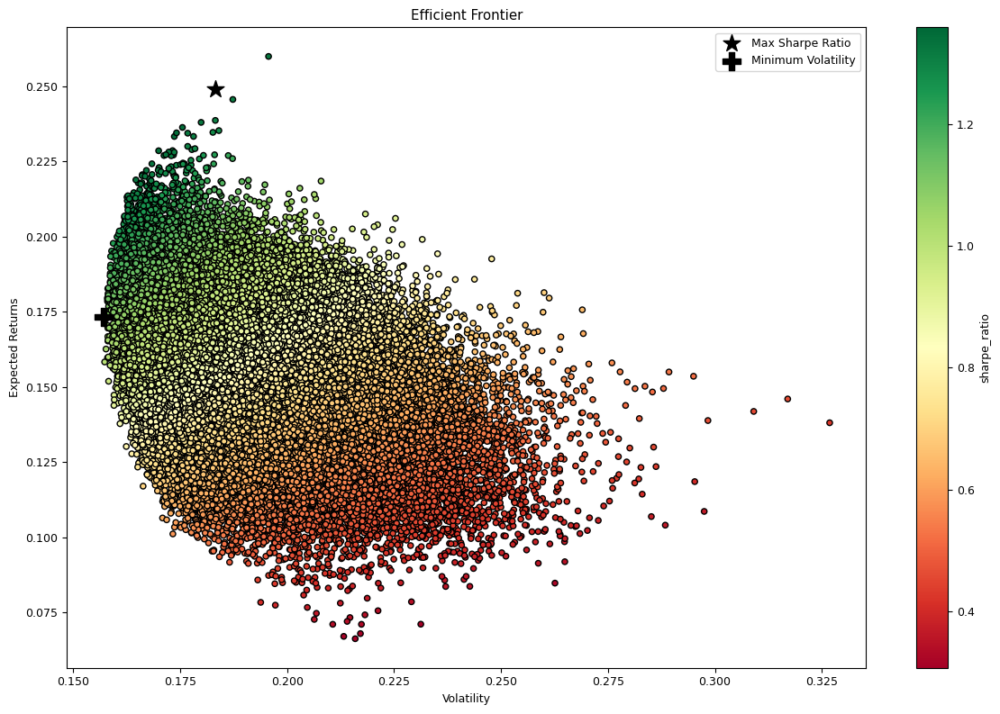

In [32]:
#stampo grafico
fig, ax = plt.subplots()
portf_results_df_s_s.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.scatter(x=max_sharpe_portf_s_s.volatility, 
           y=max_sharpe_portf_s_s.returns, 
           c='black', marker='*', 
           s=200, label='Max Sharpe Ratio')
ax.scatter(x=min_vol_portf_s_s.volatility, 
           y=min_vol_portf_s_s.returns, 
           c='black', marker='P', 
           s=200, label='Minimum Volatility')
ax.set(xlabel='Volatility', ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.legend()

plt.tight_layout()

plt.show()

# Metodo analitico con rendimenti attesi


Lowest risk
Return                                       0.120719
Risk                                         0.156836
Sharpe                                       0.642192
Weights    [0.061, 0.001, 0.424, 0.243, 0.035, 0.236]
Name: 77336, dtype: object
['XOM', 'EOG', 'ORCL', 'SNPS', 'PNC', 'MTB']

Highest return
Return                                      0.156283
Risk                                        0.308841
Sharpe                                      0.441274
Weights    [0.072, 0.71, 0.021, 0.034, 0.081, 0.082]
Name: 80574, dtype: object
['XOM', 'EOG', 'ORCL', 'SNPS', 'PNC', 'MTB']

Highest Sharpe ratio
Return                                      0.132391
Risk                                        0.164557
Sharpe                                      0.682992
Weights    [0.052, 0.05, 0.331, 0.373, 0.189, 0.006]
Name: 31049, dtype: object
['XOM', 'EOG', 'ORCL', 'SNPS', 'PNC', 'MTB']



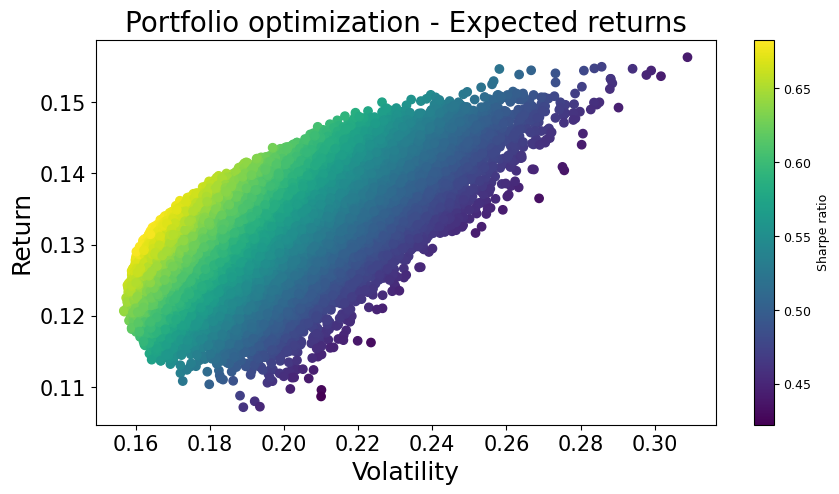

In [33]:
#inizializzo le variabili e i dataframe che mi servono per il calcolo

return_at_asset_df = {"XOM":rend_at[0],"EOG":rend_at[1],"ORCL":rend_at[2],"SNPS":rend_at[3],"PNC":rend_at[4],"MTB":rend_at[5]}
means_exp =pd.Series(data= return_at_asset_df, index=["XOM","EOG","ORCL","SNPS","PNC","MTB"])
weights = 0

#costruisco il portafoglio
portfolio_returns_an_at = []
portfolio_risks_an_at = []
sharpe_ratios_an_at = []
portfolio_weights_an_at = []
rf_exp = 0.02

#per ogni portafoglio calcolo rendimenti, i rischi e i rapporti di Sharpe 
for portfolio in range(n_port):
    weights = np.random.random_sample(len(return_108m_asset.columns))
    weights =np.round((weights / np.sum(weights)), 3)
    portfolio_weights_an_at.append(weights)
    annualized_return_an_at = np.sum(means_exp * weights)
    portfolio_returns_an_at.append(annualized_return_an_at)
    portfolio_variance_an_at = np.dot(weights.T, np.dot(mat_cov, weights))
    portfolio_standard_deviation_an_at = np.sqrt(portfolio_variance_an_at)
    portfolio_risks_an_at.append(portfolio_standard_deviation_an_at)
    sharpe_ratio_an_at = (annualized_return_an_at - rf_exp) / portfolio_standard_deviation_an_at
    sharpe_ratios_an_at.append(sharpe_ratio_an_at)

#converto le liste trovate in array
portfolio_returns_an_at = np.array(portfolio_returns_an_at)
portofolio_risks_an_at = np.array(portfolio_risks_an_at)
sharpe_ratios_an_at = np.array(sharpe_ratios_an_at)

#portafoglio metrics
metrics_an_at = [portfolio_returns_an_at, portfolio_risks_an_at, sharpe_ratios_an_at, portfolio_weights_an_at]
portfolios_df_an_at = pd.DataFrame(metrics_an_at).T
portfolios_df_an_at.columns = ['Return', 'Risk', 'Sharpe', 'Weights']

#calcolo il portafoglio con minimo rischio, con piu alto rendimento e con il piu alto indice di sharpe
min_risk_an_at = portfolios_df_an_at.iloc[portfolios_df_an_at['Risk'].astype(float).idxmin()]
highest_return_an_at = portfolios_df_an_at.iloc[portfolios_df_an_at['Return'].astype(float).idxmax()]
highest_sharpe_an_at = portfolios_df_an_at.iloc[portfolios_df_an_at['Sharpe'].astype(float).idxmax()]


#faccio le varie stampe
print('Lowest risk')
print(min_risk_an_at)
print(list(return_108m_asset))


print('')

print('Highest return')
print(highest_return_an_at)
print(list(return_108m_asset))



print('')
      
print('Highest Sharpe ratio')
print(highest_sharpe_an_at)

print(list(return_108m_asset))

print('')

#costruisco il grafico
plt.figure(figsize = (10,5))
plt.scatter(portfolio_risks_an_at, portfolio_returns_an_at, 
           c = (portfolio_returns_an_at - rf_exp)/ portfolio_risks_an_at)
plt.title('Portfolio optimization - Expected returns', fontsize = 20)
plt.xlabel('Volatility', fontsize = 18)
plt.ylabel('Return', fontsize = 18)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.colorbar(label = 'Sharpe ratio')
plt.show()





# Metodo analitico con rendimenti storici

Highest Sharpe ratio
Return                                     0.221364
Risk                                       0.164527
Sharpe                                     1.342272
Weights    [0.008, 0.0, 0.344, 0.449, 0.198, 0.002]
Name: 91352, dtype: object
['XOM', 'EOG', 'ORCL', 'SNPS', 'PNC', 'MTB']

Lowest risk
Return                                        0.16986
Risk                                         0.157223
Sharpe                                       1.077046
Weights    [0.086, 0.007, 0.406, 0.281, 0.014, 0.206]
Name: 89820, dtype: object
['XOM', 'EOG', 'ORCL', 'SNPS', 'PNC', 'MTB']

Highest return
Return                                       0.238865
Risk                                         0.178182
Sharpe                                        1.33763
Weights    [0.015, 0.023, 0.004, 0.528, 0.408, 0.023]
Name: 64367, dtype: object
['XOM', 'EOG', 'ORCL', 'SNPS', 'PNC', 'MTB']


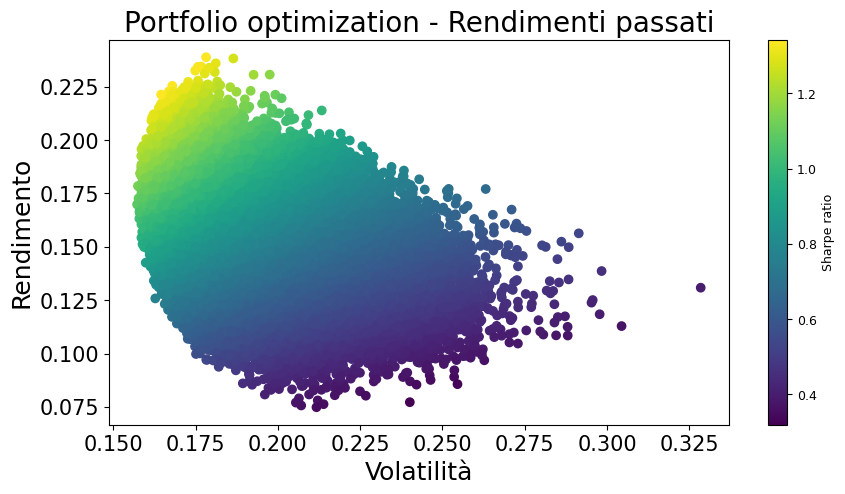

In [34]:
#costruisco il portafoglio
rf = factor_df.rf.mean()
portfolio_returns = []
portfolio_risks = []
sharpe_ratios = []
portfolio_weights = []
weights = 0
#per ogni portafoglio calcolo rendimenti, i rischi e i rapporti di Sharpe 
for portfolio in range(n_port):
    weights = np.random.random_sample(len(return_108m_asset.columns))
    weights = np.round((weights / np.sum(weights)), 3)
    portfolio_weights.append(weights)
    annualized_return = np.sum(avg_returns * weights)
    portfolio_returns.append(annualized_return)
    portfolio_variance = np.dot(weights.T, np.dot(mat_cov, weights))
    portfolio_standard_deviation = np.sqrt(portfolio_variance)
    portfolio_risks.append(portfolio_standard_deviation)
    sharpe_ratio = (annualized_return - rf) / portfolio_standard_deviation
    sharpe_ratios.append(sharpe_ratio)




#converto le liste trovate in array
portfolio_returns = np.array(portfolio_returns)
portofolio_risks = np.array(portfolio_risks)
sharpe_ratios = np.array(sharpe_ratios)

#portfoglio metrics
portfolio_metrics = [portfolio_returns, portfolio_risks, sharpe_ratios, portfolio_weights]
portfolios_df = pd.DataFrame(portfolio_metrics).T
portfolios_df.columns = ['Return', 'Risk', 'Sharpe', 'Weights']

#calcolo il portafoglio con minimo rischio, con piu alto rendimento e con il piu alto indice di sharpe
min_risk = portfolios_df.iloc[portfolios_df['Risk'].astype(float).idxmin()]
highest_return = portfolios_df.iloc[portfolios_df['Return'].astype(float).idxmax()]
highest_sharpe = portfolios_df.iloc[portfolios_df['Sharpe'].astype(float).idxmax()]

print('Highest Sharpe ratio')
print(highest_sharpe)
print(list(return_108m_asset))
print('')

print('Lowest risk')
print(min_risk)
print(list(return_108m_asset))
print('')

print('Highest return')
print(highest_return)
print(list(return_108m_asset))

#costruisco il grafico
plt.figure(figsize = (10,5))
plt.scatter(portfolio_risks, portfolio_returns, 
           c = (portfolio_returns - rf)/ portfolio_risks)
plt.title('Portfolio optimization - Rendimenti passati', fontsize = 20)
plt.xlabel('Volatilità', fontsize = 18)
plt.ylabel('Rendimento', fontsize = 18)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.colorbar(label = 'Sharpe ratio')
plt.show()

## Metodo con simulazione dei rendimenti attesi

<function matplotlib.pyplot.show(close=None, block=None)>

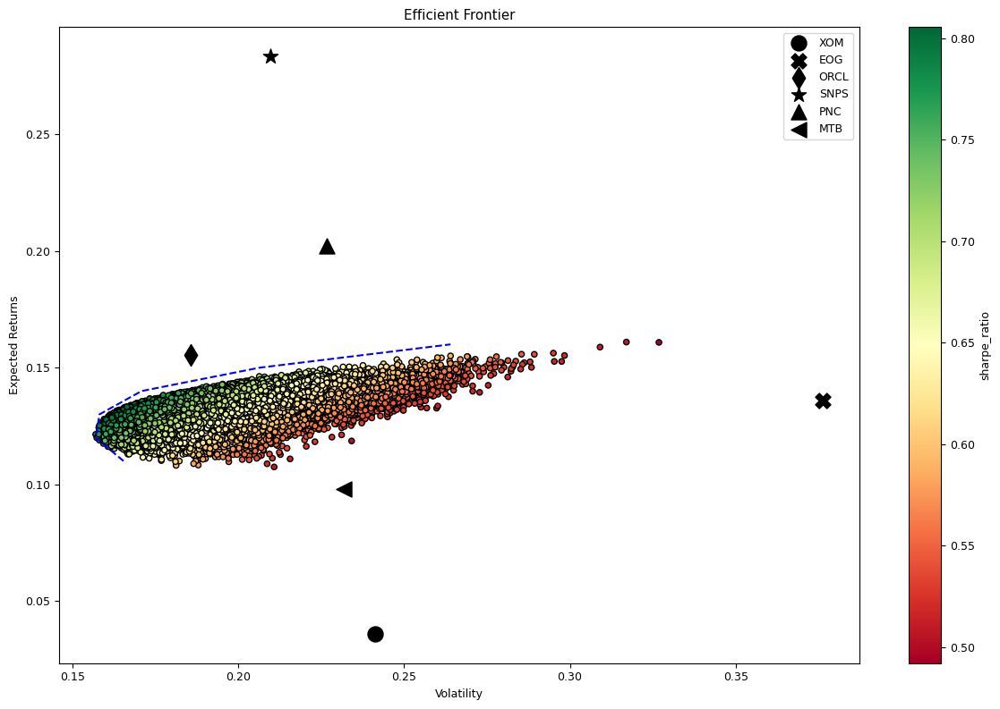

In [35]:
#utilizzo Monte carlo per trovare la frontiera efficiente e successivamente i portafogli


#simulazione
np.random.seed(42)
weights = np.random.random(size=(n_port, n_assets))
weights /=  np.sum(weights, axis=1)[:, np.newaxis]

#calcolo rendimenti portafoglio
portf_rtns_s_at = np.dot(weights,means_exp)
portf_vol_s_at = []
for i in range(0, len(weights)):
    portf_vol_s_at.append(np.sqrt(np.dot(weights[i].T, 
                                    np.dot(mat_cov, weights[i]))))
portf_vol_s_at = np.array(portf_vol_s_at)  
portf_sharpe_ratio_s_at = portf_rtns_s_at / portf_vol_s_at

portf_results_df_s_at = pd.DataFrame({'returns': portf_rtns_s_at,
                                 'volatility': portf_vol_s_at,
                                 'sharpe_ratio': portf_sharpe_ratio_s_at})

#creo la frontiera efficiente
n_points = 100
portf_vol_ef_s_at = []
indices_to_skip = []

portf_rtns_ef_s_at = np.linspace(portf_results_df_s_at.returns.min(), 
                            portf_results_df_s_at.returns.max(), 
                           n_points)
portf_rtns_ef_s_at = np.round(portf_rtns_ef_s_at, 2)    
portf_rtns_s_at = np.round(portf_rtns_s_at, 2)

#Per ogni punto nella frontiera efficiente, cerco l'indice di rendimento corrispondente nel portafoglio.
for point_index in range(n_points):
    if portf_rtns_ef_s_at[point_index] not in portf_rtns_s_at:
        indices_to_skip.append(point_index)
        continue
    matched_ind = np.where(portf_rtns_s_at == portf_rtns_ef_s_at[point_index])
    portf_vol_ef_s_at.append(np.min(portf_vol_s_at[matched_ind]))

# Cancella gli indici da saltare dalla frontiera efficiente di rendimento.
portf_rtns_ef_s_at = np.delete(portf_rtns_ef_s_at, indices_to_skip)

# Creazione di una lista di segni per rappresentare i singoli asset.
MARKS = ['o', 'X', 'd', '*','^','<']
asset = asset_name

#creo i grafici per rappresentare la frontiera efficiente
fig, ax = plt.subplots()
portf_results_df_s_at.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.plot(portf_vol_ef_s_at, portf_rtns_ef_s_at, 'b--')
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(mat_cov.iloc[asset_index, asset_index]), 
                y=avg_returns[asset_index], 
                marker=MARKS[asset_index], 
                s=150, 
                color='black',
                label=asset[asset_index])
ax.legend()

plt.tight_layout()
plt.show


In [36]:
#calcolo portafoglio max sharpe ratio
max_sharpe_ind_s_at = np.argmax(portf_results_df_s_at.sharpe_ratio)
max_sharpe_portf_s_at = portf_results_df_s_at.loc[max_sharpe_ind_s_at]

#calcolo portafoglio volatilità minima
min_vol_ind_s_at = np.argmin(portf_results_df_s_at.volatility)
min_vol_portf_s_at = portf_results_df_s_at.loc[min_vol_ind_s_at]

print('Maximum Sharpe Ratio portfolio')
print('Performance')
for index, value in max_sharpe_portf_s_at.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(asset_name, weights[np.argmax(portf_results_df_s_at.sharpe_ratio)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)
print()
print()
print('Minimum Volatility portfolio ----')
print('Performance')
for index, value in min_vol_portf_s_at.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(asset_name, weights[np.argmin(portf_results_df_s_at.volatility)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)    
    
weights_max_sharp_s_a = weights[np.argmax(portf_results_df_s_at.sharpe_ratio)]
weights_min_vol_s_a = weights[np.argmin(portf_results_df_s_at.volatility)]
            

Maximum Sharpe Ratio portfolio
Performance
returns: 13.16% volatility: 16.33% sharpe_ratio: 80.54% 
Weights
XOM: 8.94% EOG: 3.71% ORCL: 33.66% SNPS: 32.88% PNC: 20.60% MTB: 0.22% 

Minimum Volatility portfolio ----
Performance
returns: 12.14% volatility: 15.70% sharpe_ratio: 77.33% 
Weights
XOM: 6.41% EOG: 0.43% ORCL: 38.93% SNPS: 30.21% PNC: 0.69% MTB: 23.34% 

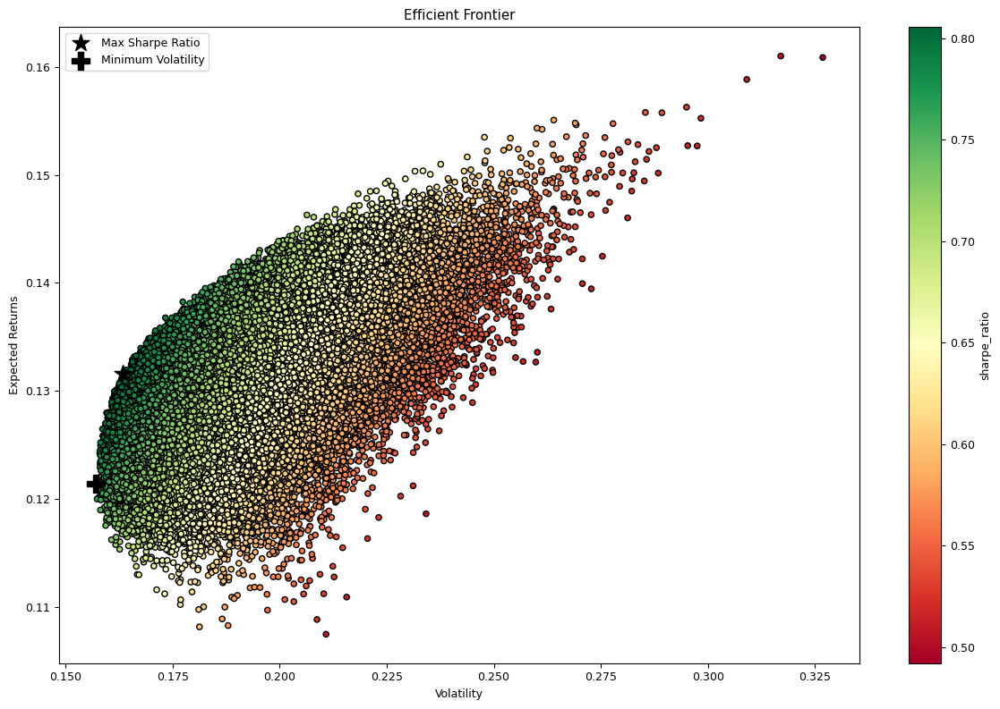

In [37]:
#creo i grafici per rappresentare i portafogli nella frontiera efficiente
fig, ax = plt.subplots()
portf_results_df_s_at.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.scatter(x=max_sharpe_portf_s_at.volatility, 
           y=max_sharpe_portf_s_at.returns, 
           c='black', marker='*', 
           s=200, label='Max Sharpe Ratio')
ax.scatter(x=min_vol_portf_s_at.volatility, 
           y=min_vol_portf_s_at.returns, 
           c='black', marker='P', 
           s=200, label='Minimum Volatility')
ax.set(xlabel='Volatility', ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.legend()

plt.tight_layout()

plt.show()

## 6b) Beta Portafoglio


Start date,2012-12-03
End date,2022-11-29
Total months,119
,Backtest
Annual return,15.209%
Cumulative returns,311.033%
Annual volatility,21.96%
Sharpe ratio,0.75
Calmar ratio,0.35
Stability,0.86
Max drawdown,-43.776%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,43.78,2020-01-09,2020-03-23,2021-01-06,260
1,22.77,2018-01-26,2018-12-24,2019-04-12,316
2,19.01,2015-06-11,2016-01-20,2016-06-23,271
3,15.72,2022-06-07,2022-07-14,2022-08-12,49
4,13.47,2022-08-18,2022-09-26,2022-11-10,61


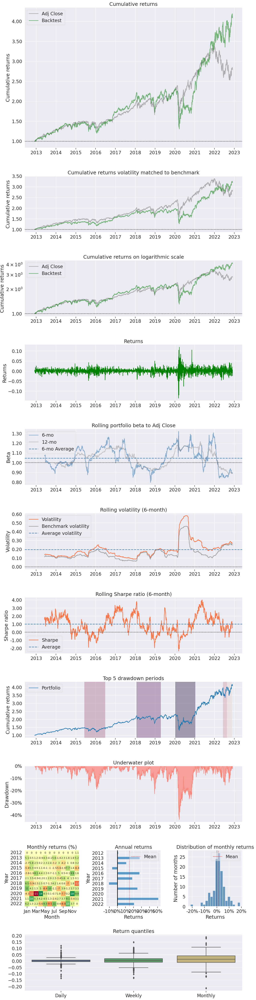

In [38]:
#calcolo beta portafoglio effettivo
#calcolo il market benchmark e ricalcolo i rendimenti 
n_assets = 6
b_m_df = sp500_df["Adj Close"]
b_m_df = b_m_df.pct_change().dropna()
return_dfs = adj_close_asset.pct_change().dropna()

#calcolo i pesi equivalenti
pt_weights = n_assets*[1/n_assets]
pt_returnsf = pd.Series(np.dot(pt_weights,return_dfs.T), index = return_dfs.index)

#richiamo pyfolio per calcolare il beta e creare i grafici
pf.create_returns_tear_sheet(pt_returnsf, benchmark_rets = b_m_df)

Start date,2012-12-03
End date,2022-11-29
Total months,119
,Backtest
Annual return,23.282%
Cumulative returns,708.254%
Annual volatility,23.235%
Sharpe ratio,1.02
Calmar ratio,0.64
Stability,0.96
Max drawdown,-36.27%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,36.27,2020-02-19,2020-03-23,2020-05-29,73
1,24.26,2022-08-15,2022-10-12,NaT,NaN
2,23.65,2021-12-27,2022-05-11,2022-08-05,160
3,22.03,2018-08-27,2018-12-24,2019-03-11,141
4,20.26,2015-11-19,2016-01-21,2016-06-06,143


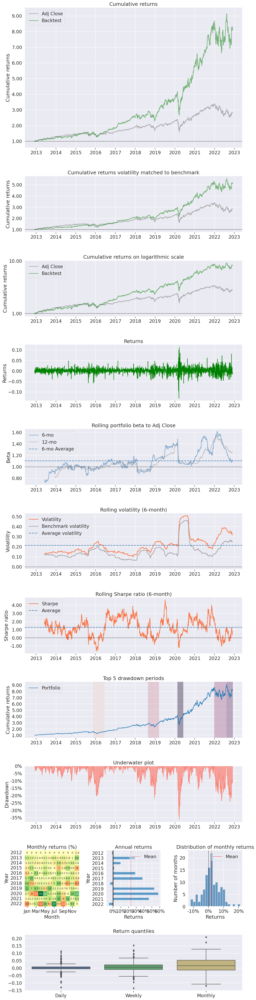

In [39]:
#calcolo beta portafoglio max_sharp_ratio simulato con rendimenti storici

#utilizzo i pesi calcolati precedentemente  e calcolo il rendimento del portafoglio
pt_weights = weights_max_sharpe_sim
pt_returnsf_ss1 = pd.Series(np.dot(pt_weights,return_dfs.T), index = return_dfs.index)

#utilizzo pyfolio per stampare i grafici e calcolare il beta
pf.create_returns_tear_sheet(pt_returnsf_ss1, benchmark_rets = b_m_df)

Start date,2012-12-03
End date,2022-11-29
Total months,119
,Backtest
Annual return,17.954%
Cumulative returns,419.982%
Annual volatility,20.576%
Sharpe ratio,0.91
Calmar ratio,0.52
Stability,0.95
Max drawdown,-34.709%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,34.71,2020-02-19,2020-03-23,2020-06-08,79
1,20.40,2021-12-10,2022-10-11,NaT,NaN
2,19.86,2018-09-25,2018-12-24,2019-03-11,120
3,18.57,2015-06-11,2016-01-20,2016-07-14,286
4,12.41,2018-01-26,2018-04-02,2018-09-20,170


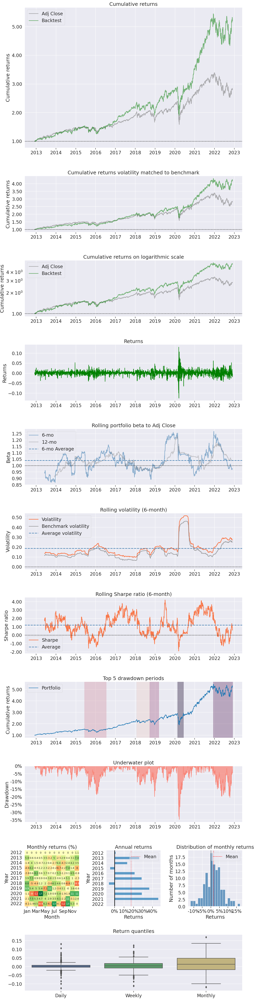

In [40]:
#calcolo beta portafoglio max_sharp_ratio simulato con rendimenti attesi


#utilizzo i pesi calcolati precedentemente  e calcolo il rendimento del portafoglio
pt_weights = weights_max_sharp_s_a
pt_returnsf_sa = pd.Series(np.dot(pt_weights,return_dfs.T), index = return_dfs.index)



#utilizzo pyfolio per stampare i grafici e calcolare il beta
pf.create_returns_tear_sheet(pt_returnsf_sa, benchmark_rets = b_m_df)

Start date,2012-12-03
End date,2022-11-29
Total months,119
,Backtest
Annual return,16.312%
Cumulative returns,352.07%
Annual volatility,20.73%
Sharpe ratio,0.83
Calmar ratio,0.49
Stability,0.95
Max drawdown,-33.418%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,33.42,2020-02-19,2020-03-23,2020-08-28,138
1,19.25,2015-06-17,2016-01-21,2016-06-23,267
2,18.89,2018-01-26,2018-12-24,2019-02-12,273
3,18.17,2022-08-15,2022-10-11,NaT,NaN
4,16.92,2021-12-10,2022-05-11,2022-08-11,175


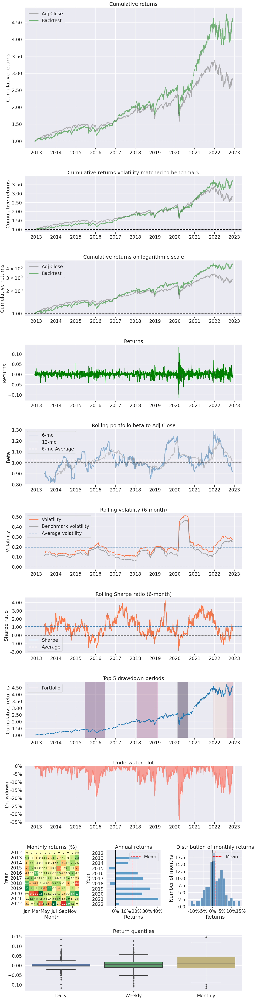

In [41]:
#calcolo beta portafoglio minima volatilità simulato con rendimenti storici 

#utilizzo i pesi calcolati precedentemente  e calcolo il rendimento del portafoglio
pt_weights = weights_min_vol_ss
pt_returnsf_ss2 = pd.Series(np.dot(pt_weights,return_dfs.T), index = return_dfs.index)

#utilizzo pyfolio per stampare i grafici e calcolare il beta
pf.create_returns_tear_sheet(pt_returnsf_ss2, benchmark_rets = b_m_df)

Start date,2012-12-03
End date,2022-11-29
Total months,119
,Backtest
Annual return,16.312%
Cumulative returns,352.07%
Annual volatility,20.73%
Sharpe ratio,0.83
Calmar ratio,0.49
Stability,0.95
Max drawdown,-33.418%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,33.42,2020-02-19,2020-03-23,2020-08-28,138
1,19.25,2015-06-17,2016-01-21,2016-06-23,267
2,18.89,2018-01-26,2018-12-24,2019-02-12,273
3,18.17,2022-08-15,2022-10-11,NaT,NaN
4,16.92,2021-12-10,2022-05-11,2022-08-11,175


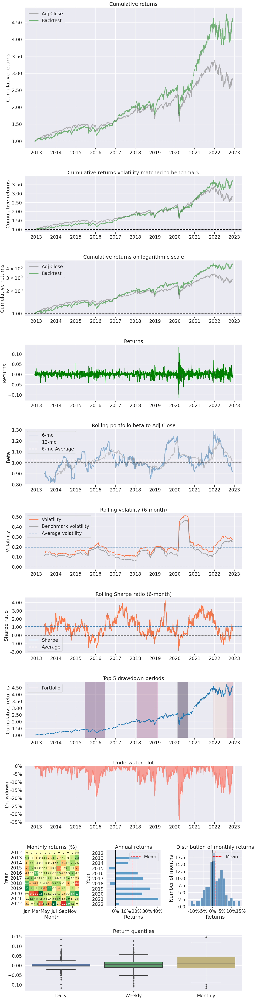

In [42]:
#calcolo beta portafoglio minima volatilità simulato con rendimenti attesi

#utilizzo i pesi calcolati precedentemente  e calcolo il rendimento del portafoglio
pt_weights = weights_min_vol_s_a 
pt_returnsf_ss = pd.Series(np.dot(pt_weights,return_dfs.T), index = return_dfs.index)

#utilizzo pyfolio per stampare i grafici e calcolare il beta
pf.create_returns_tear_sheet(pt_returnsf_ss, benchmark_rets = b_m_df)

Start date,2012-12-03
End date,2022-11-29
Total months,119
,Backtest
Annual return,15.209%
Cumulative returns,311.033%
Annual volatility,21.96%
Sharpe ratio,0.75
Calmar ratio,0.35
Stability,0.86
Max drawdown,-43.776%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,43.78,2020-01-09,2020-03-23,2021-01-06,260
1,22.77,2018-01-26,2018-12-24,2019-04-12,316
2,19.01,2015-06-11,2016-01-20,2016-06-23,271
3,15.72,2022-06-07,2022-07-14,2022-08-12,49
4,13.47,2022-08-18,2022-09-26,2022-11-10,61


Start date,2012-12-03
End date,2022-11-29
Total months,119
,Backtest
Annual return,15.209%
Cumulative returns,311.033%
Annual volatility,21.96%
Sharpe ratio,0.75
Calmar ratio,0.35
Stability,0.86
Max drawdown,-43.776%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,43.78,2020-01-09,2020-03-23,2021-01-06,260
1,22.77,2018-01-26,2018-12-24,2019-04-12,316
2,19.01,2015-06-11,2016-01-20,2016-06-23,271
3,15.72,2022-06-07,2022-07-14,2022-08-12,49
4,13.47,2022-08-18,2022-09-26,2022-11-10,61


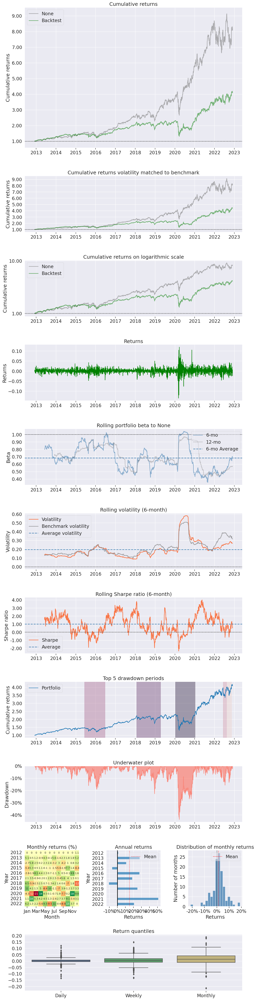

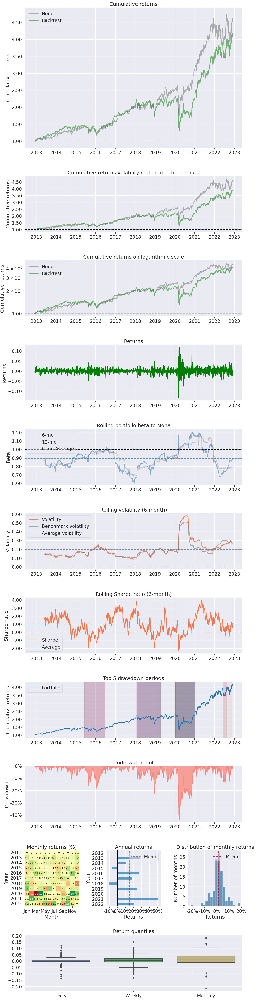

In [43]:
pf.create_returns_tear_sheet(pt_returnsf, benchmark_rets = pt_returnsf_ss1)
pf.create_returns_tear_sheet(pt_returnsf, benchmark_rets = pt_returnsf_ss2)